In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
dataset=pd.read_excel("/content/drive/My Drive/Data_Train.xlsx")

# Understanding given Data

In [ ]:
dataset.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74


In [ ]:
dataset.tail()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,Manual,First,28.4 kmpl,1248 CC,74 bhp,5.0,4.75
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,Manual,First,24.4 kmpl,1120 CC,71 bhp,5.0,4.00
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,Manual,Second,14.0 kmpl,2498 CC,112 bhp,8.0,2.90
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,Manual,First,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65
6018,Chevrolet Beat Diesel,Hyderabad,2011,47000,Diesel,Manual,First,25.44 kmpl,936 CC,57.6 bhp,5.0,2.50


In [ ]:
dataset.shape

(6019, 12)

In [ ]:
dataset.columns

Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'Price'],
      dtype='object')

In [ ]:
dataset.nunique

<bound method DataFrame.nunique of                                   Name    Location  ...  Seats  Price
0               Maruti Wagon R LXI CNG      Mumbai  ...    5.0   1.75
1     Hyundai Creta 1.6 CRDi SX Option        Pune  ...    5.0  12.50
2                         Honda Jazz V     Chennai  ...    5.0   4.50
3                    Maruti Ertiga VDI     Chennai  ...    7.0   6.00
4      Audi A4 New 2.0 TDI Multitronic  Coimbatore  ...    5.0  17.74
...                                ...         ...  ...    ...    ...
6014                  Maruti Swift VDI       Delhi  ...    5.0   4.75
6015          Hyundai Xcent 1.1 CRDi S      Jaipur  ...    5.0   4.00
6016             Mahindra Xylo D4 BSIV      Jaipur  ...    8.0   2.90
6017                Maruti Wagon R VXI     Kolkata  ...    5.0   2.65
6018             Chevrolet Beat Diesel   Hyderabad  ...    5.0   2.50

[6019 rows x 12 columns]>

In [ ]:
dataset.dtypes


Name                  object
Location              object
Year                   int64
Kilometers_Driven      int64
Fuel_Type             object
Transmission          object
Owner_Type            object
Mileage               object
Engine                object
Power                 object
Seats                float64
Price                float64
dtype: object

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6019 entries, 0 to 6018
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               6019 non-null   object 
 1   Location           6019 non-null   object 
 2   Year               6019 non-null   int64  
 3   Kilometers_Driven  6019 non-null   int64  
 4   Fuel_Type          6019 non-null   object 
 5   Transmission       6019 non-null   object 
 6   Owner_Type         6019 non-null   object 
 7   Mileage            6017 non-null   object 
 8   Engine             5983 non-null   object 
 9   Power              5983 non-null   object 
 10  Seats              5977 non-null   float64
 11  Price              6019 non-null   float64
dtypes: float64(2), int64(2), object(8)
memory usage: 564.4+ KB


# Clean Data(Null value removal, Outlier identification)

In [ ]:
dataset.isnull().sum()

Name                  0
Location              0
Year                  0
Kilometers_Driven     0
Fuel_Type             0
Transmission          0
Owner_Type            0
Mileage               2
Engine               36
Power                36
Seats                42
Price                 0
dtype: int64

In [ ]:
dataset[dataset['Engine'].isnull()]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
194,Honda City 1.5 GXI,Ahmedabad,2007,60006,Petrol,Manual,First,0.0 kmpl,NaN,NaN,NaN,2.95
208,Maruti Swift 1.3 VXi,Kolkata,2010,42001,Petrol,Manual,First,16.1 kmpl,NaN,NaN,NaN,2.11
733,Maruti Swift 1.3 VXi,Chennai,2006,97800,Petrol,Manual,Third,16.1 kmpl,NaN,NaN,NaN,1.75
749,Land Rover Range Rover 3.0 D,Mumbai,2008,55001,Diesel,Automatic,Second,0.0 kmpl,NaN,NaN,NaN,26.50
1294,Honda City 1.3 DX,Delhi,2009,55005,Petrol,Manual,First,12.8 kmpl,NaN,NaN,NaN,3.20
1327,Maruti Swift 1.3 ZXI,Hyderabad,2015,50295,Petrol,Manual,First,16.1 kmpl,NaN,NaN,NaN,5.80
1385,Honda City 1.5 GXI,Pune,2004,115000,Petrol,Manual,Second,0.0 kmpl,NaN,NaN,NaN,1.50
1460,Land Rover Range Rover Sport 2005 2012 Sport,Coimbatore,2008,69078,Petrol,Manual,First,0.0 kmpl,NaN,NaN,NaN,40.88
2074,Maruti Swift 1.3 LXI,Pune,2011,24255,Petrol,Manual,First,16.1 kmpl,NaN,NaN,NaN,3.15
2096,Hyundai Santro LP zipPlus,Coimbatore,2004,52146,Petrol,Manual,First,0.0 kmpl,NaN,NaN,NaN,1.93


In [ ]:
#dataset.columns
data=dataset.dropna( subset = ['Engine', 'Power', 'Seats'], how = 'all')

In [ ]:
data.isnull().sum()

Name                 0
Location             0
Year                 0
Kilometers_Driven    0
Fuel_Type            0
Transmission         0
Owner_Type           0
Mileage              2
Engine               0
Power                0
Seats                6
Price                0
dtype: int64

In [ ]:
newdata=data.dropna(subset = ['Mileage'] ,how = 'all')

In [ ]:
newdata.isnull().sum()

Name                 0
Location             0
Year                 0
Kilometers_Driven    0
Fuel_Type            0
Transmission         0
Owner_Type           0
Mileage              0
Engine               0
Power                0
Seats                6
Price                0
dtype: int64

In [ ]:
newdataset=newdata.dropna(subset = ['Seats'], how = 'all')

In [ ]:
newdataset.isnull().sum()

Name                 0
Location             0
Year                 0
Kilometers_Driven    0
Fuel_Type            0
Transmission         0
Owner_Type           0
Mileage              0
Engine               0
Power                0
Seats                0
Price                0
dtype: int64

# So now our data doesn't have any null values

# For eliminating null values  we have used dropna for specific columns only 3-4 columns have null values and all the rows which have null values have been eliminated

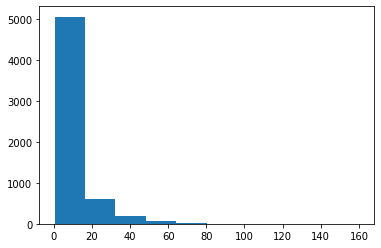

In [ ]:
plt.hist(newdataset.Price)
plt.show()

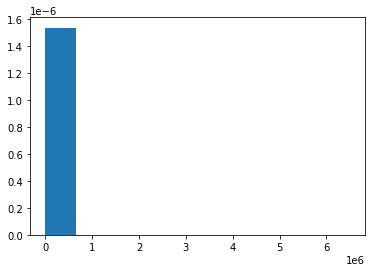

In [ ]:
plt.hist(newdataset.Kilometers_Driven, bins=10, density=True)
plt.show()

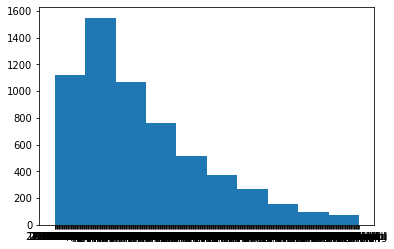

In [ ]:
plt.hist(newdataset.Mileage)
plt.show()

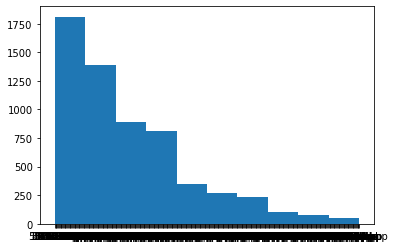

In [ ]:
plt.hist(newdataset.Power)
plt.show()

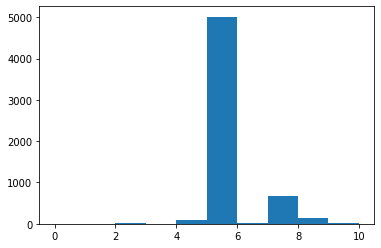

In [ ]:
plt.hist(newdataset.Seats)
plt.show()

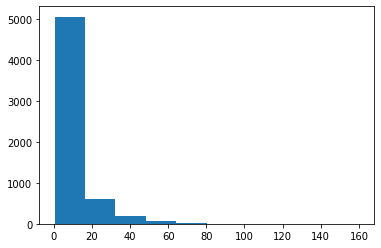

In [ ]:
plt.hist(newdataset.Price)
plt.show()

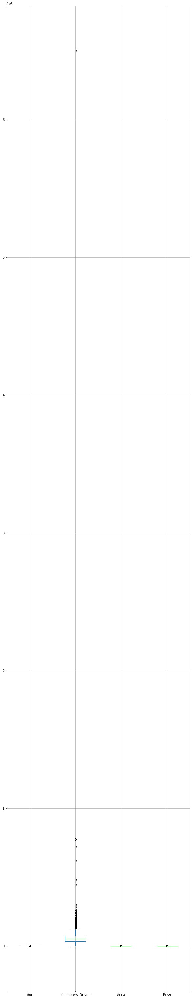

In [ ]:
newdataset.boxplot(figsize=(10,55))
plt.show()

# From the above box plot we can say that their are outliers in the Kilometers driven column

In [ ]:
newdataset.Kilometers_Driven.std()

91558.51436127977

In [ ]:
newdataset.Kilometers_Driven.mean()

58674.3149790795

# Removing outliers

In [ ]:
newdataset['z score']= (newdataset.Kilometers_Driven-newdataset.Kilometers_Driven.mean())/newdataset.Kilometers_Driven.std()
newdataset.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,z score
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643


In [ ]:
newdataset[newdataset['z score']>3]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,z score
340,Skoda Octavia Ambition Plus 2.0 TDI AT,Kolkata,2013,775000,Diesel,Automatic,First,19.3 kmpl,1968 CC,141 bhp,5.0,7.50,7.823693
358,Hyundai i10 Magna 1.2,Chennai,2009,620000,Petrol,Manual,First,20.36 kmpl,1197 CC,78.9 bhp,5.0,2.70,6.130786
1860,Volkswagen Vento Diesel Highline,Chennai,2013,720000,Diesel,Manual,First,20.54 kmpl,1598 CC,103.6 bhp,5.0,5.90,7.222984
2328,BMW X5 xDrive 30d M Sport,Chennai,2017,6500000,Diesel,Automatic,First,15.97 kmpl,2993 CC,258 bhp,5.0,65.00,70.352012
2823,Volkswagen Jetta 2013-2015 2.0L TDI Highline AT,Chennai,2015,480000,Diesel,Automatic,First,16.96 kmpl,1968 CC,138.03 bhp,5.0,13.00,4.601709
3092,Honda City i VTEC SV,Kolkata,2015,480000,Petrol,Manual,First,17.4 kmpl,1497 CC,117.3 bhp,5.0,5.00,4.601709
4491,Hyundai i20 Magna Optional 1.2,Bangalore,2013,445000,Petrol,Manual,First,18.5 kmpl,1197 CC,82.9 bhp,5.0,4.45,4.219440


In [ ]:
no_outlier_dataset=newdataset[(newdataset['z score']>-3) & (newdataset['z score']<3)]
no_outlier_dataset

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,z score
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,Manual,First,28.4 kmpl,1248 CC,74 bhp,5.0,4.75,-0.341960
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,Manual,First,24.4 kmpl,1120 CC,71 bhp,5.0,4.00,0.451358
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,Manual,Second,14.0 kmpl,2498 CC,112 bhp,8.0,2.90,-0.040131
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,Manual,First,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65,-0.138429


In [ ]:
no_outlier_dataset

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,z score
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,Manual,First,28.4 kmpl,1248 CC,74 bhp,5.0,4.75,-0.341960
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,Manual,First,24.4 kmpl,1120 CC,71 bhp,5.0,4.00,0.451358
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,Manual,Second,14.0 kmpl,2498 CC,112 bhp,8.0,2.90,-0.040131
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,Manual,First,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65,-0.138429


# Exploratory data analysis 

In [ ]:
corelation=no_outlier_dataset.corr()

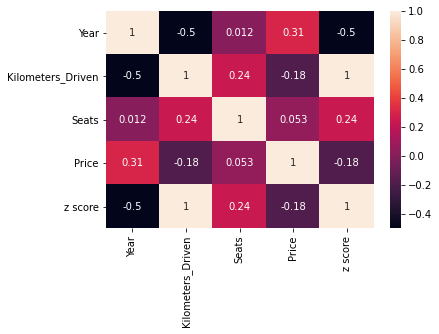

In [ ]:
sb.heatmap(corelation, xticklabels=corelation.columns , yticklabels=corelation.columns,annot=True)

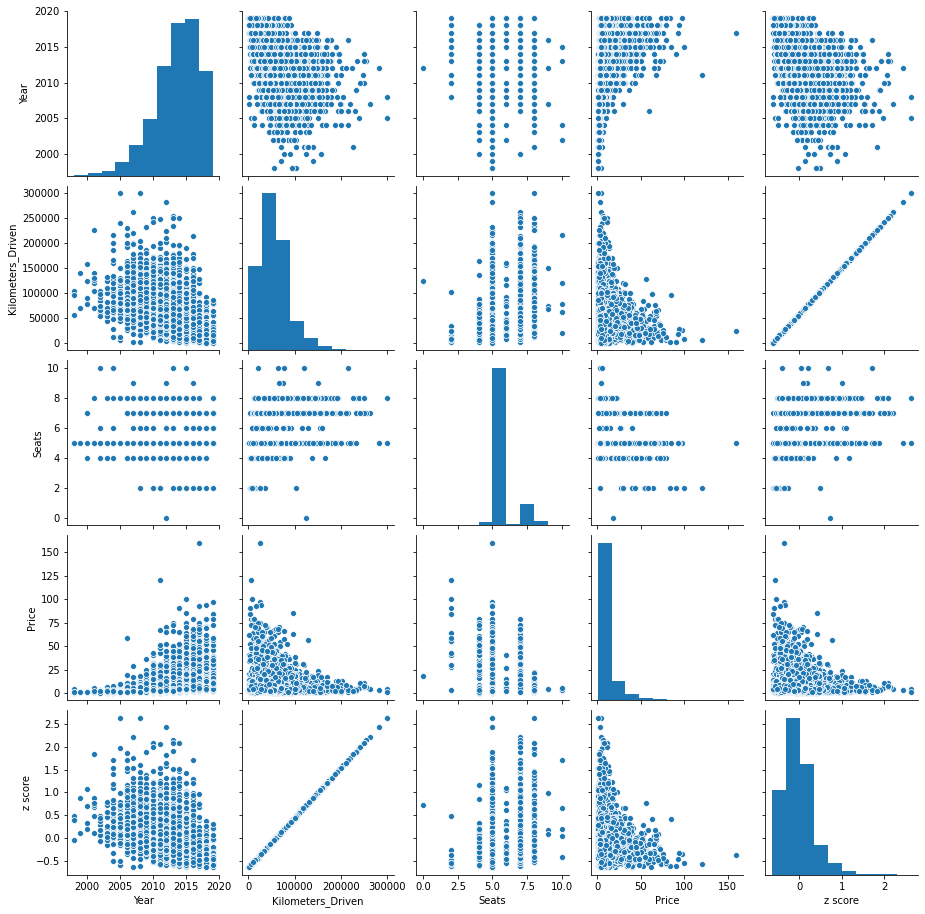

In [ ]:
sb.pairplot(no_outlier_dataset)

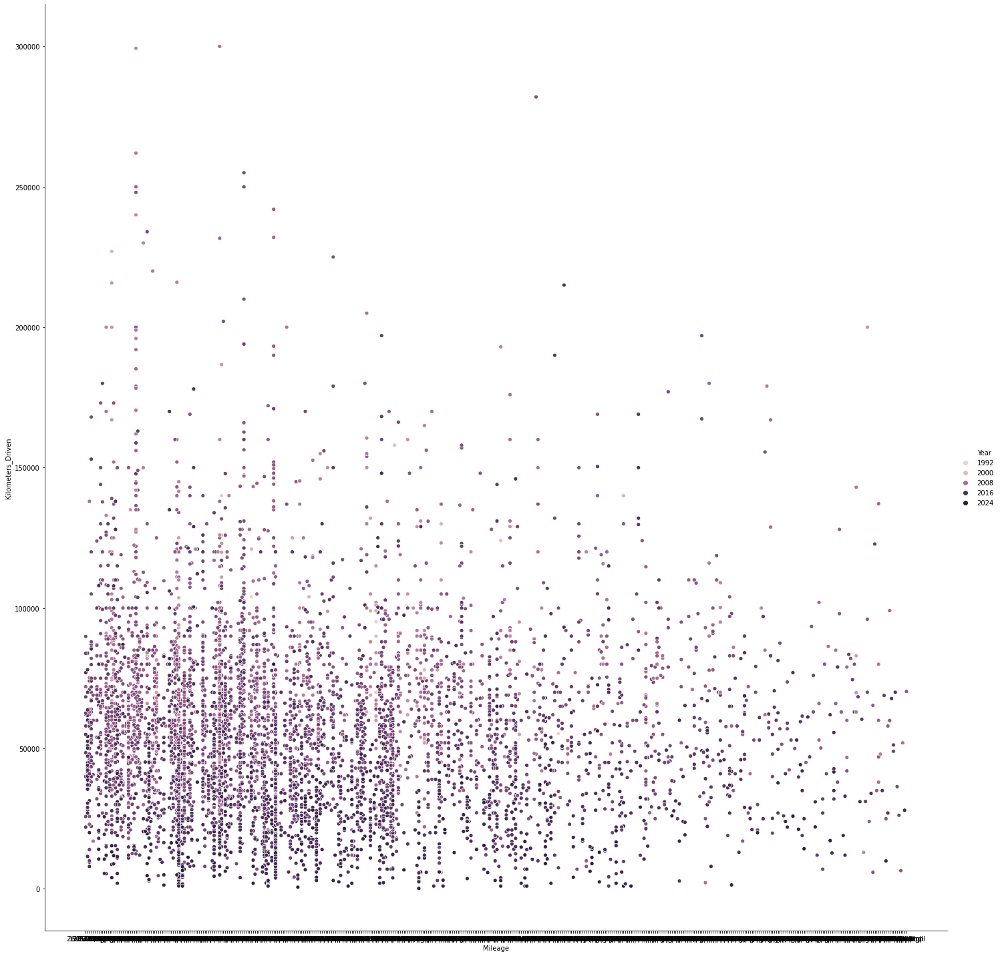

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Mileage',y='Kilometers_Driven',hue='Year',height=20,data=no_outlier_dataset)

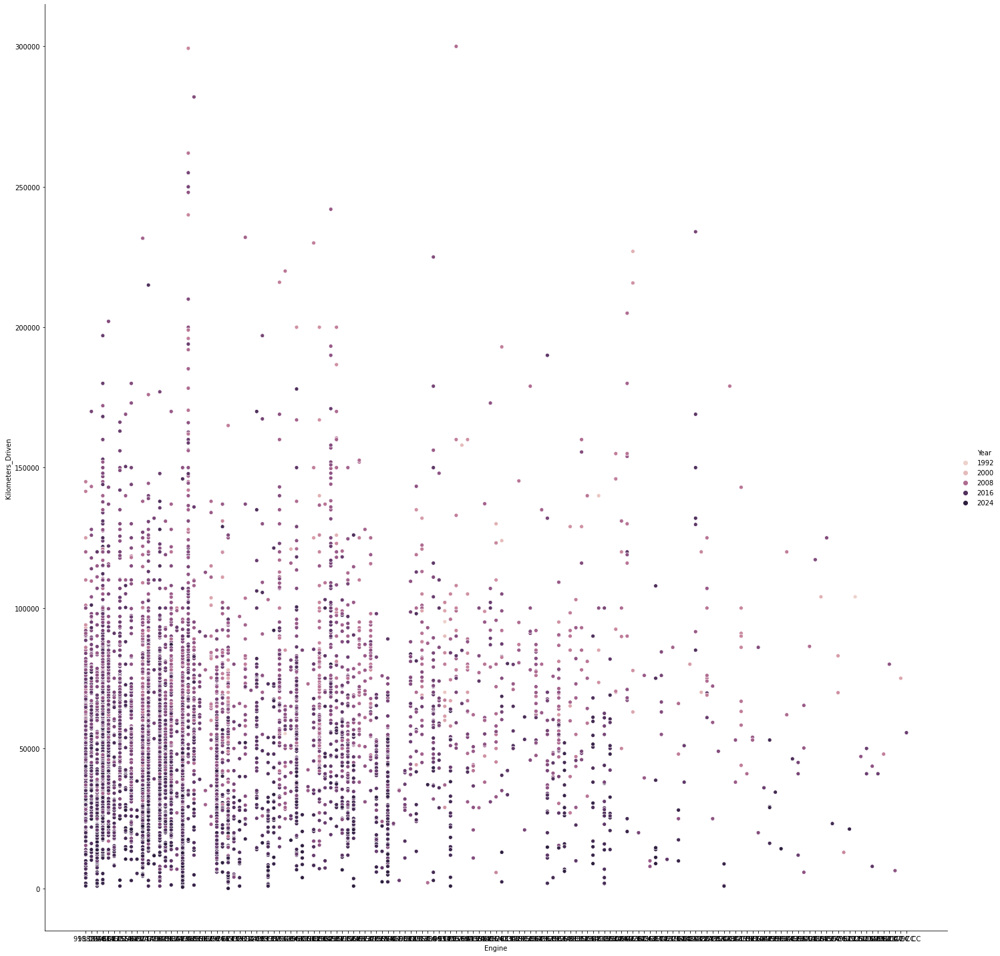

In [ ]:
sb.relplot(x='Engine',y='Kilometers_Driven',hue='Year',height=20,data=no_outlier_dataset)

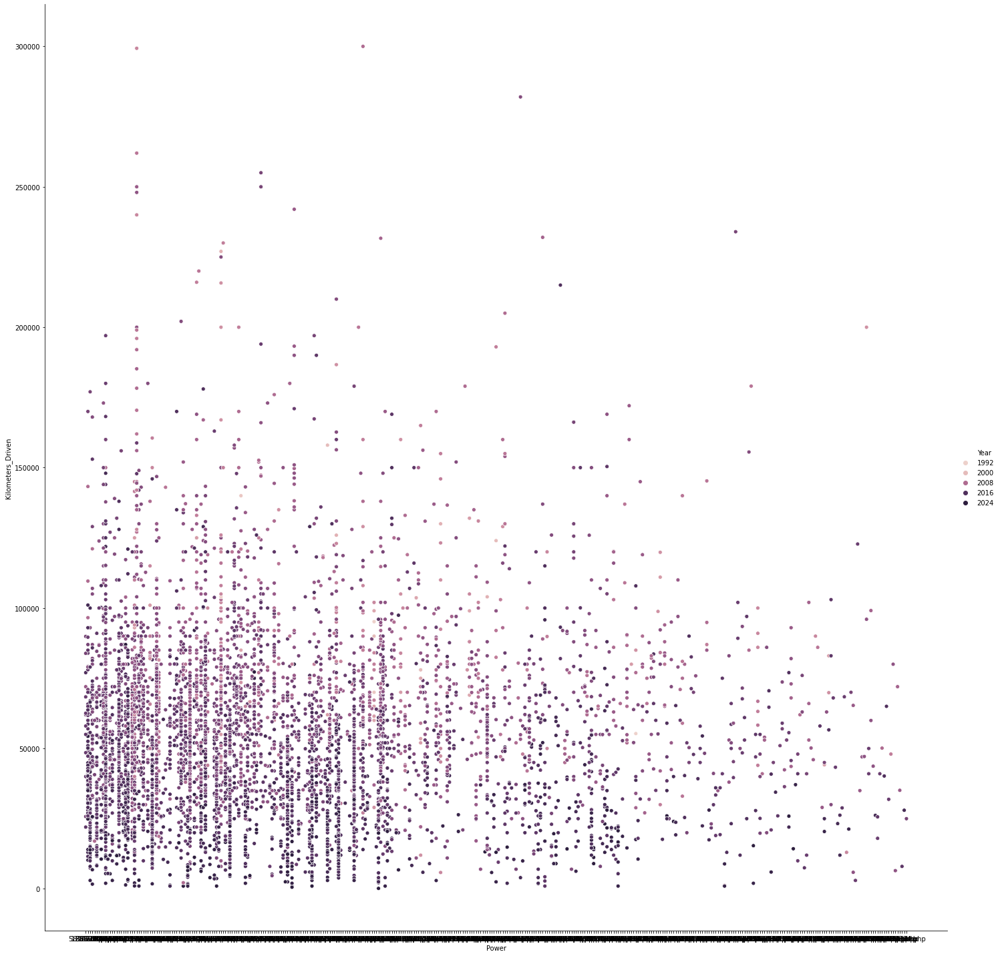

In [ ]:
sb.relplot(x='Power',y='Kilometers_Driven',hue='Year',height=20,data=no_outlier_dataset)

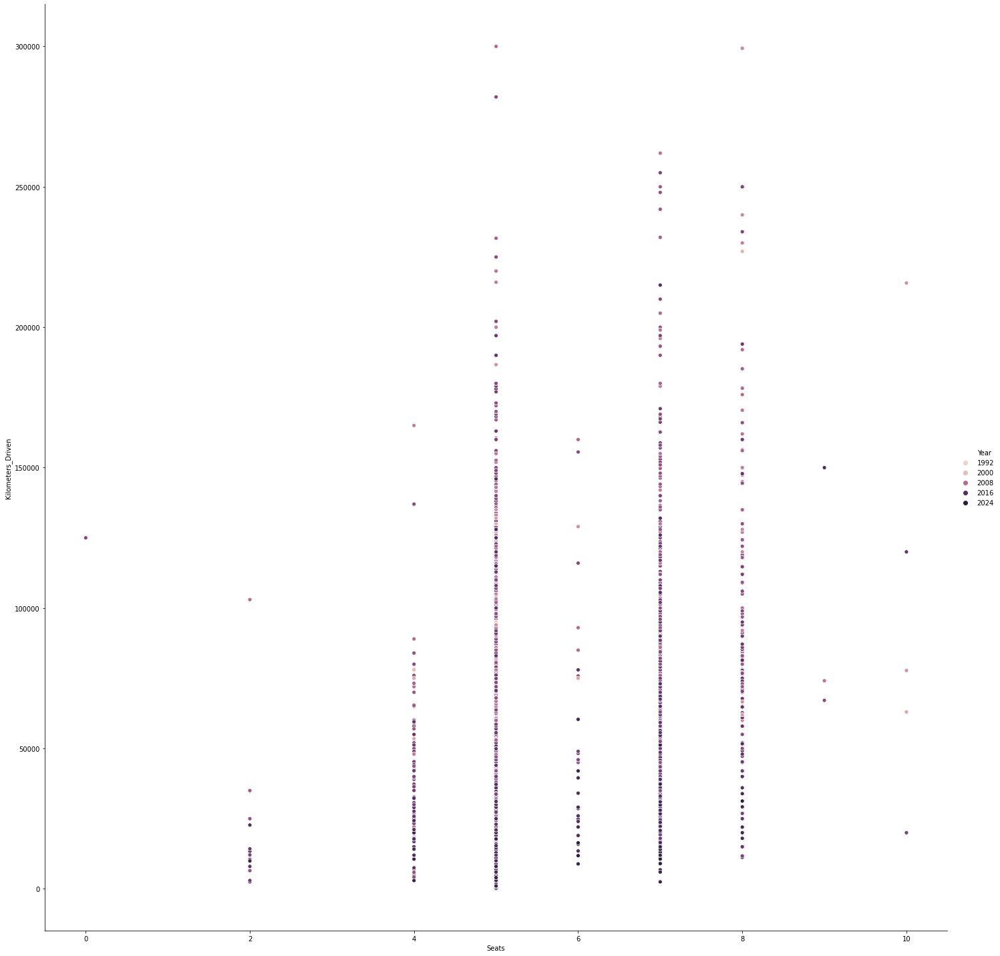

In [ ]:
sb.relplot(x='Seats',y='Kilometers_Driven',hue='Year',height=20,data=no_outlier_dataset)

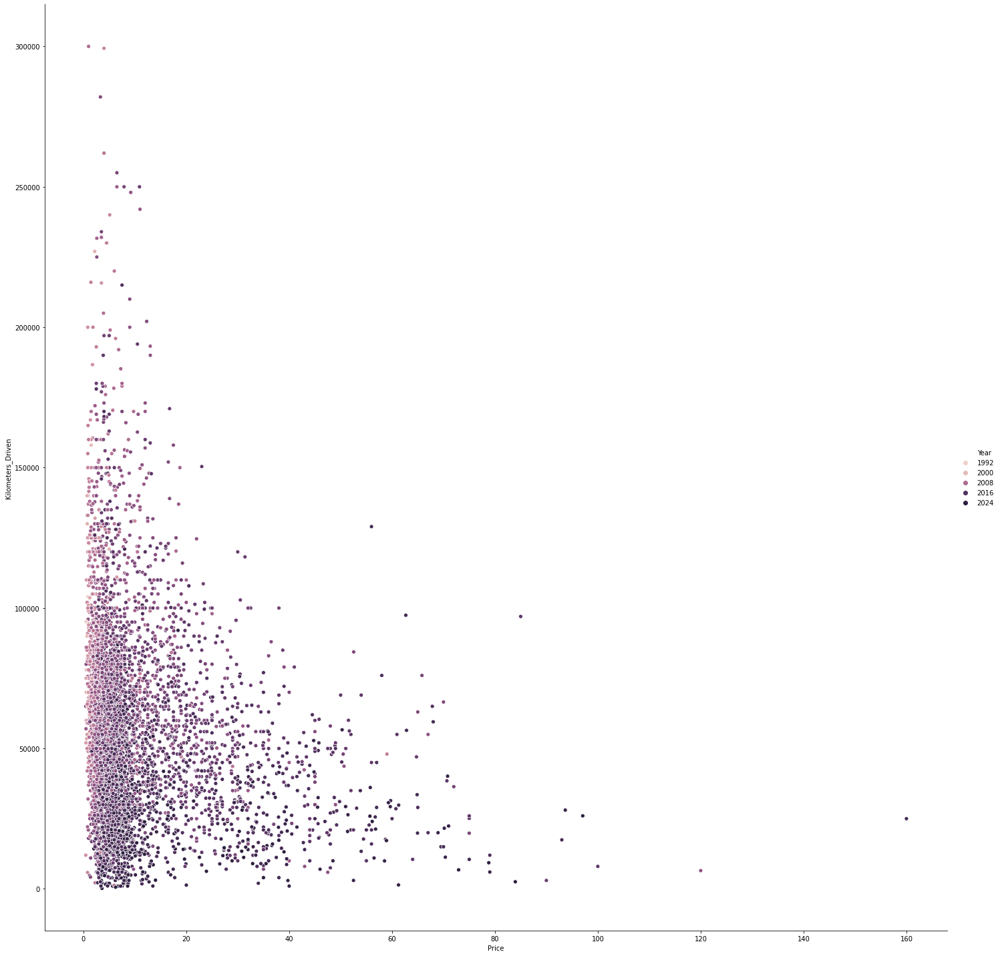

In [ ]:
sb.relplot(x='Price',y='Kilometers_Driven',hue='Year',height=20,data=no_outlier_dataset)

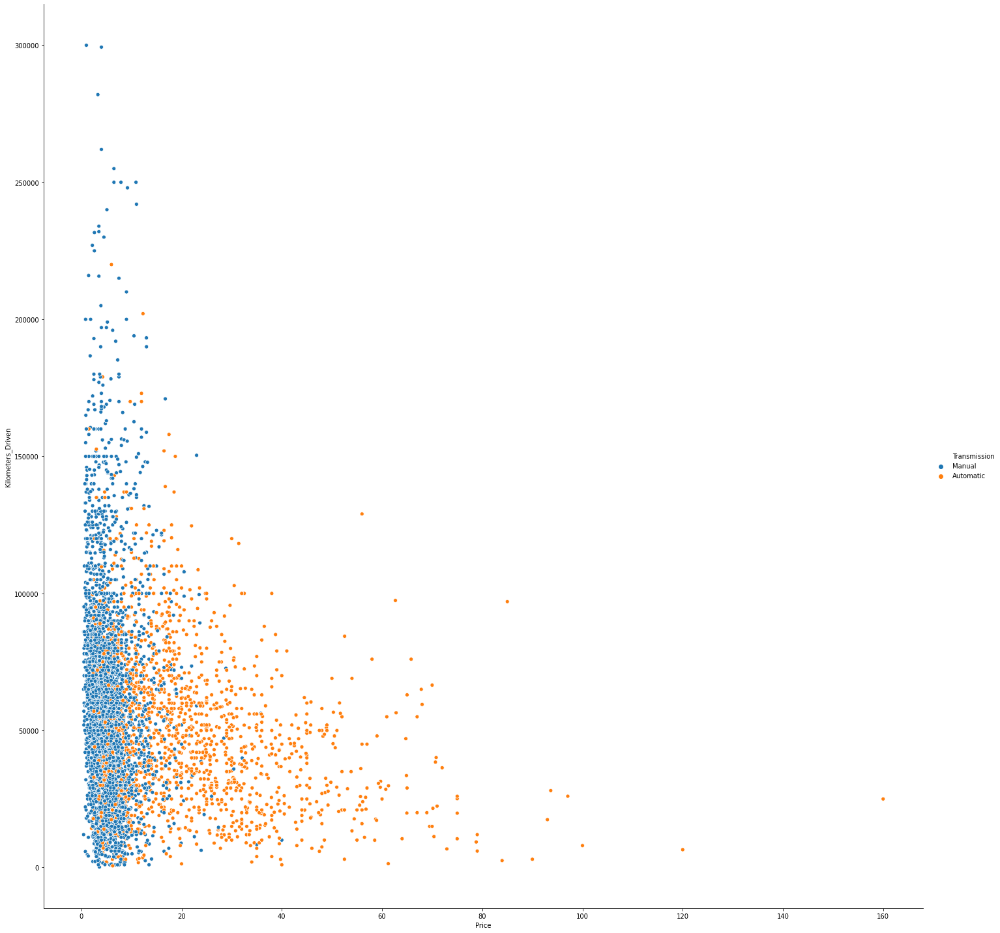

In [ ]:
sb.relplot(x='Price',y='Kilometers_Driven',hue='Transmission',height=20,data=no_outlier_dataset)

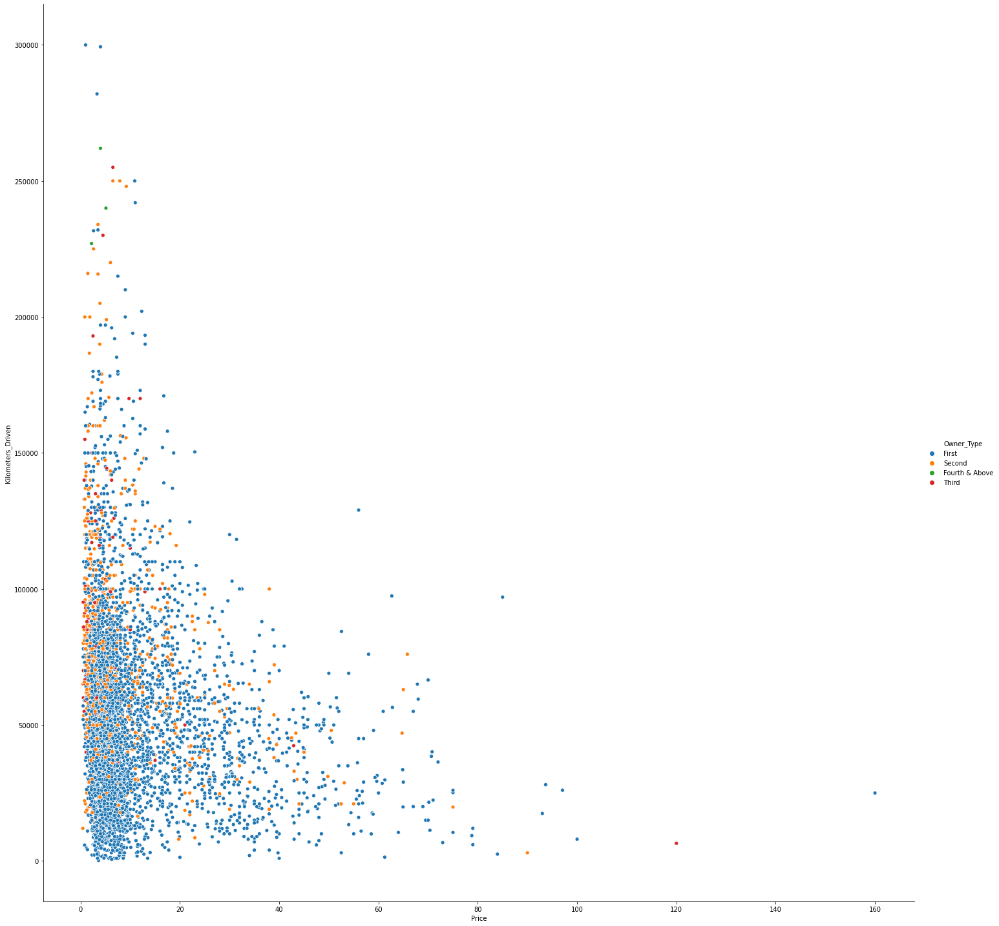

In [ ]:
sb.relplot(x='Price',y='Kilometers_Driven',hue='Owner_Type',height=20,data=no_outlier_dataset)

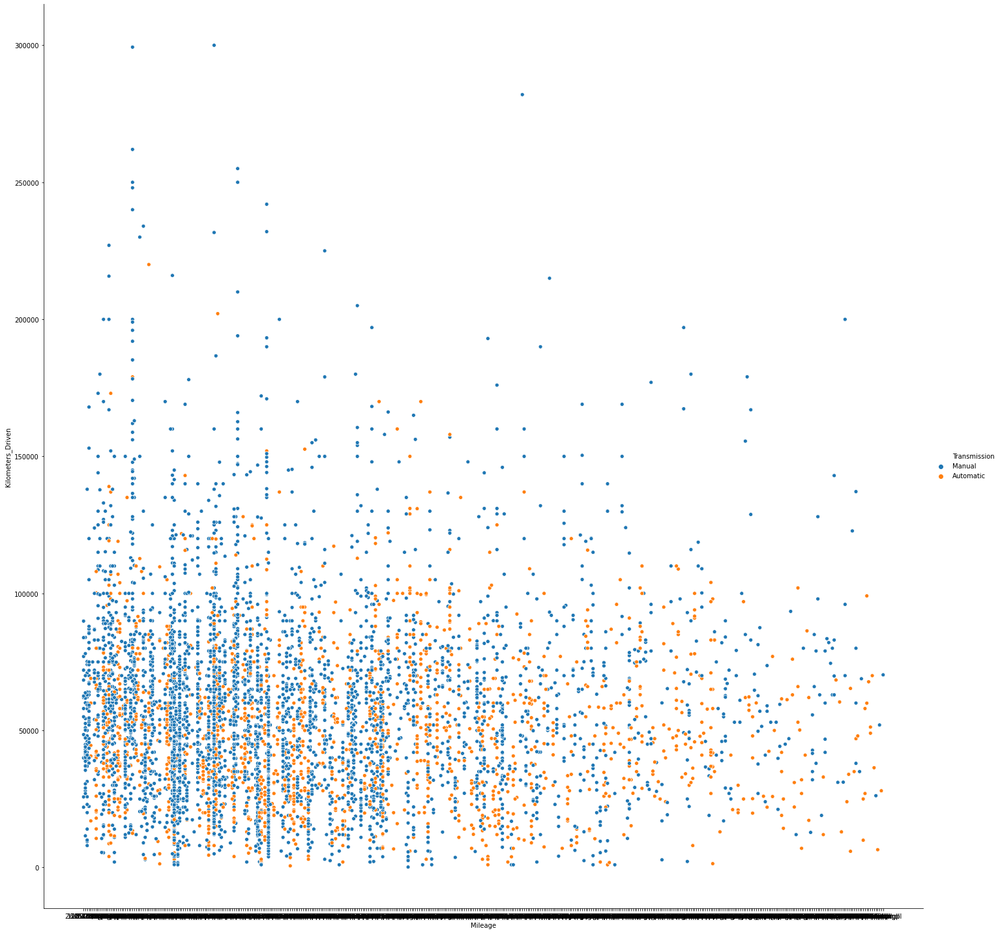

In [ ]:
sb.relplot(x='Mileage',y='Kilometers_Driven',hue='Transmission',height=20,data=no_outlier_dataset)

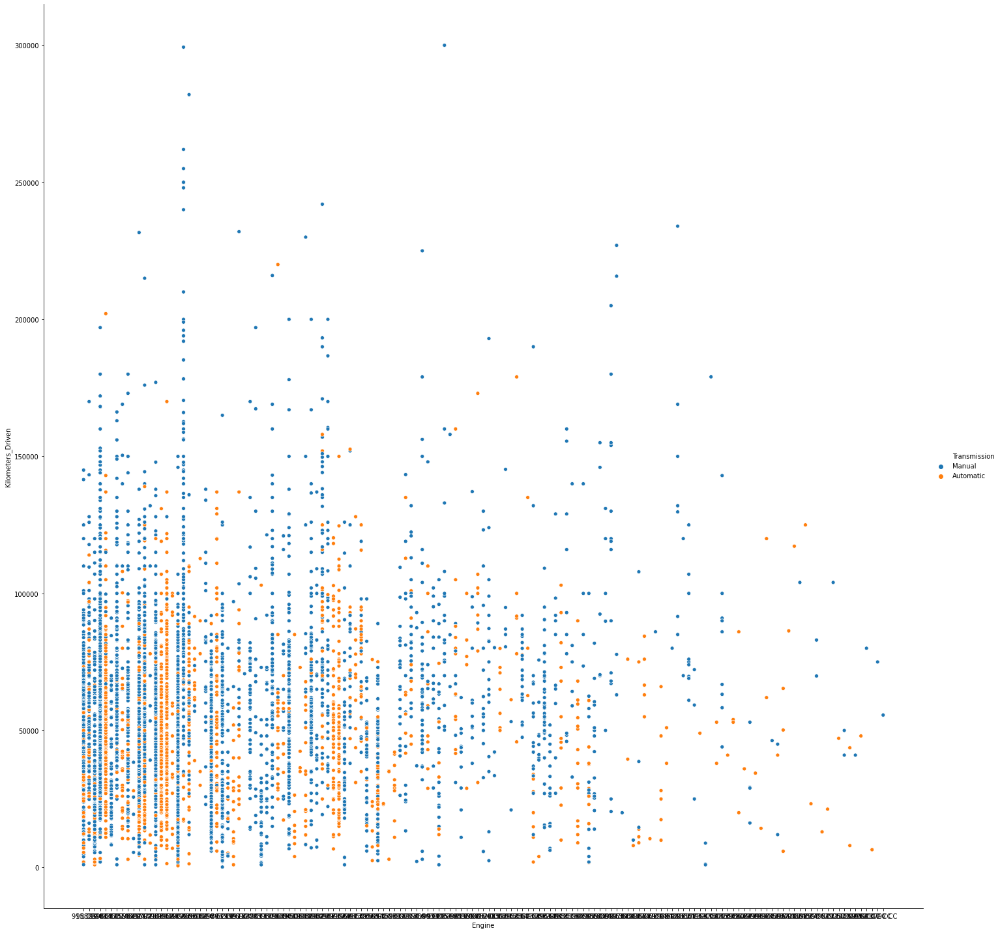

In [ ]:
sb.relplot(x='Engine',y='Kilometers_Driven',hue='Transmission',height=20,data=no_outlier_dataset)

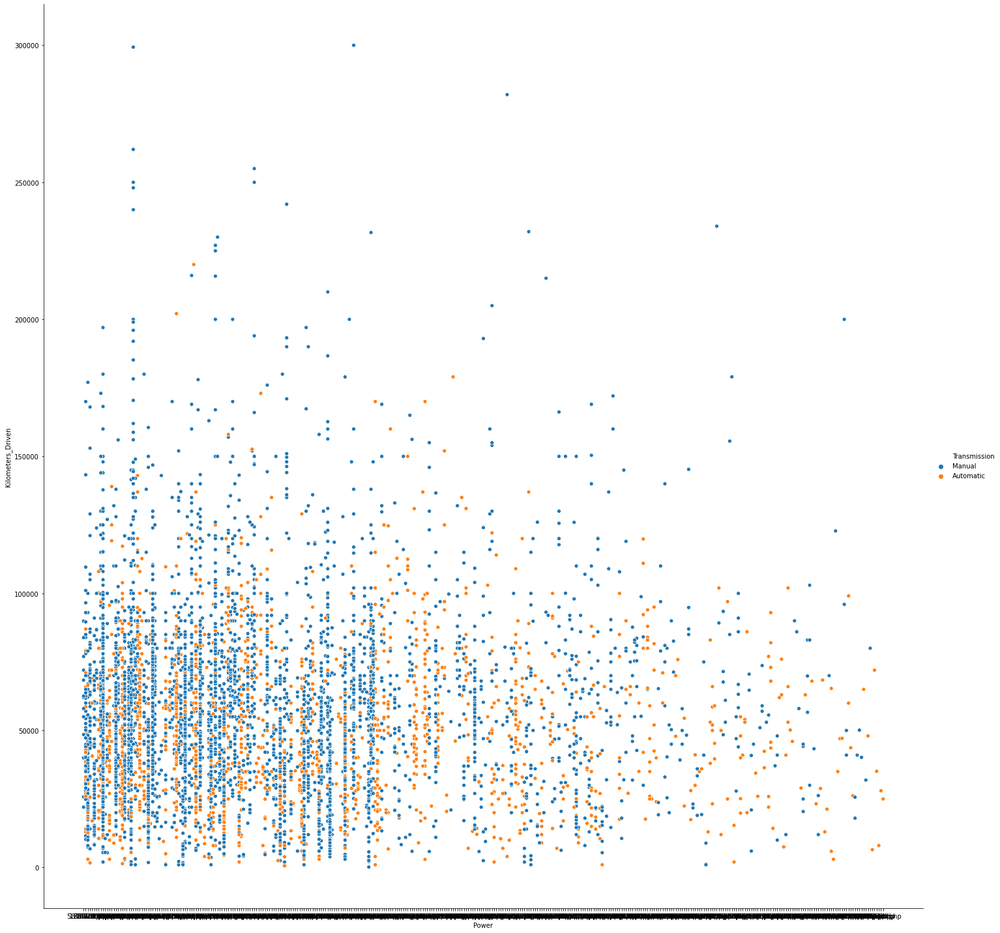

In [ ]:
sb.relplot(x='Power',y='Kilometers_Driven',hue='Transmission',height=20,data=no_outlier_dataset)

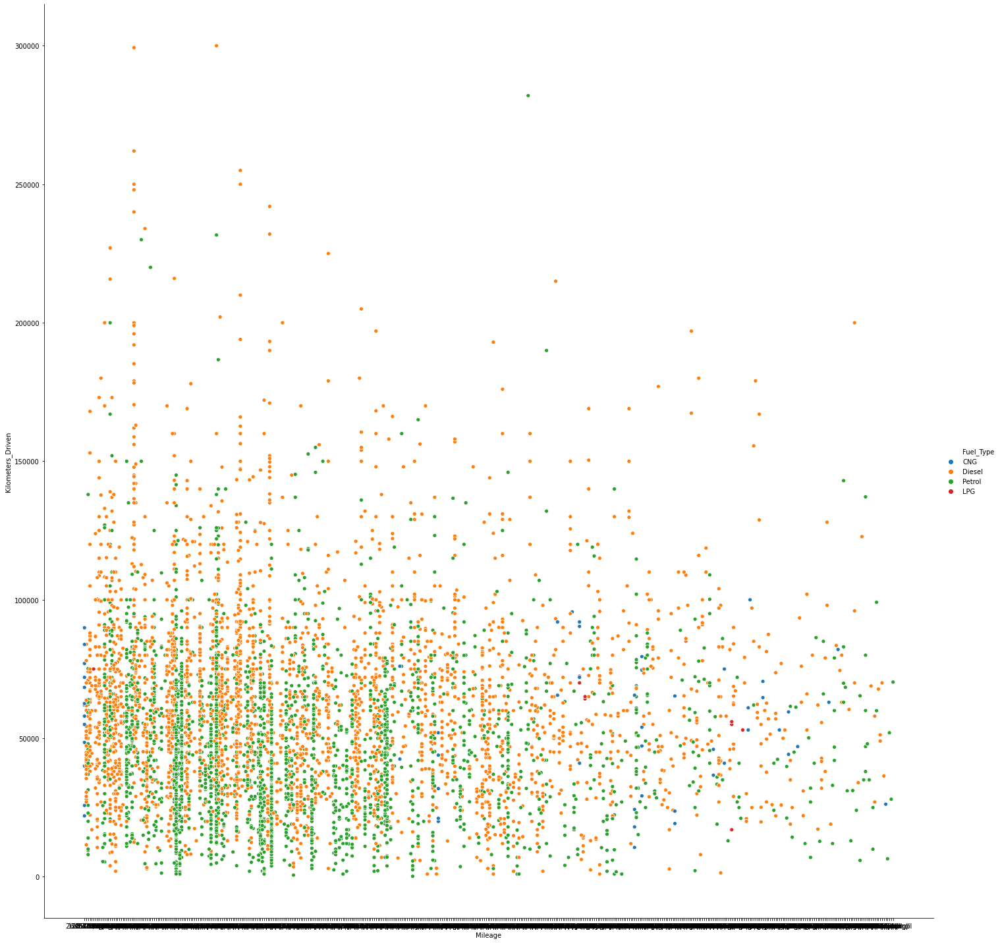

In [ ]:
sb.relplot(x='Mileage',y='Kilometers_Driven',hue='Fuel_Type',height=20,data=no_outlier_dataset)

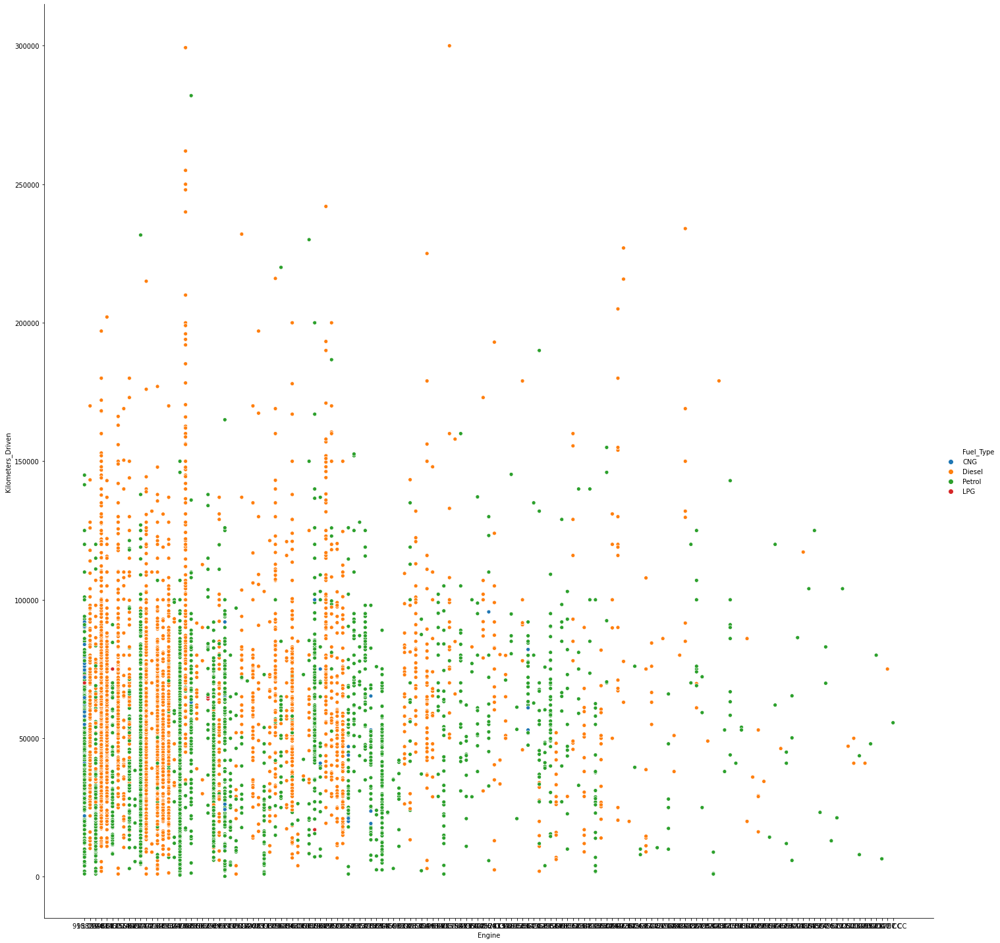

In [ ]:
sb.relplot(x='Engine',y='Kilometers_Driven',hue='Fuel_Type',height=20,data=no_outlier_dataset)

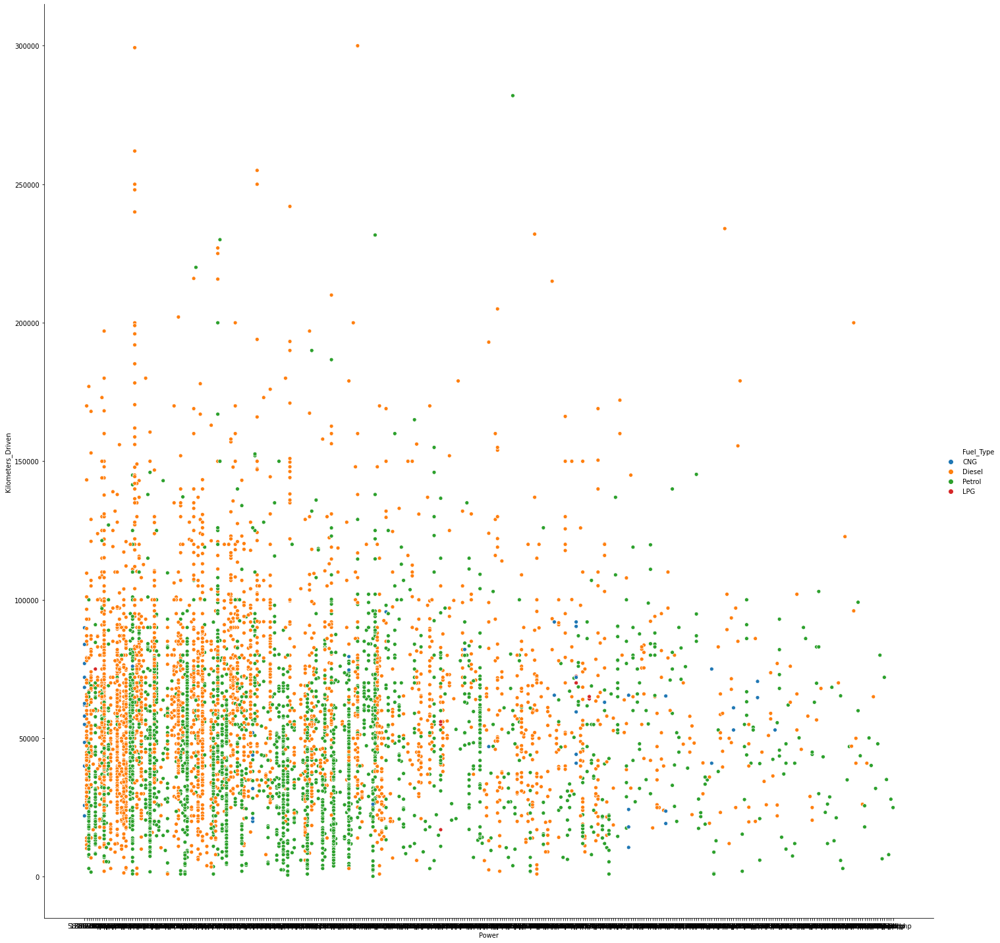

In [ ]:
sb.relplot(x='Power',y='Kilometers_Driven',hue='Fuel_Type',height=20,data=no_outlier_dataset)

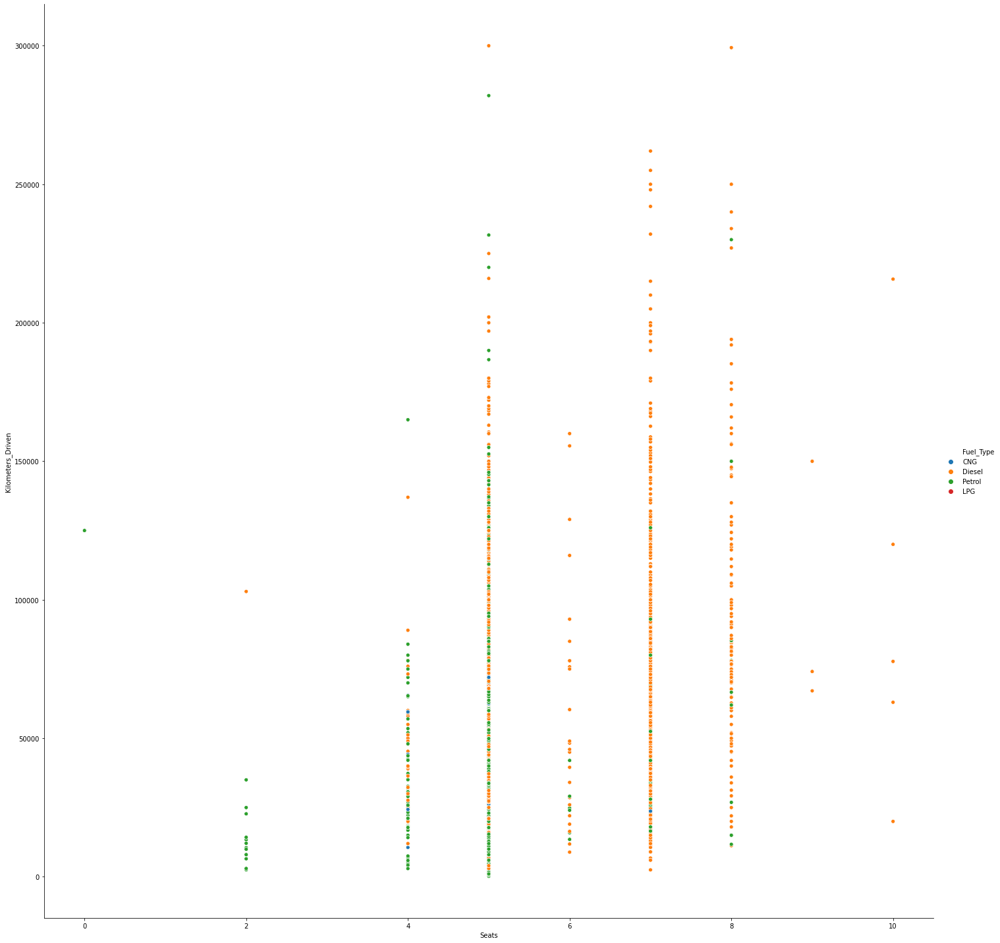

In [ ]:
sb.relplot(x='Seats',y='Kilometers_Driven',hue='Fuel_Type',height=20,data=no_outlier_dataset)

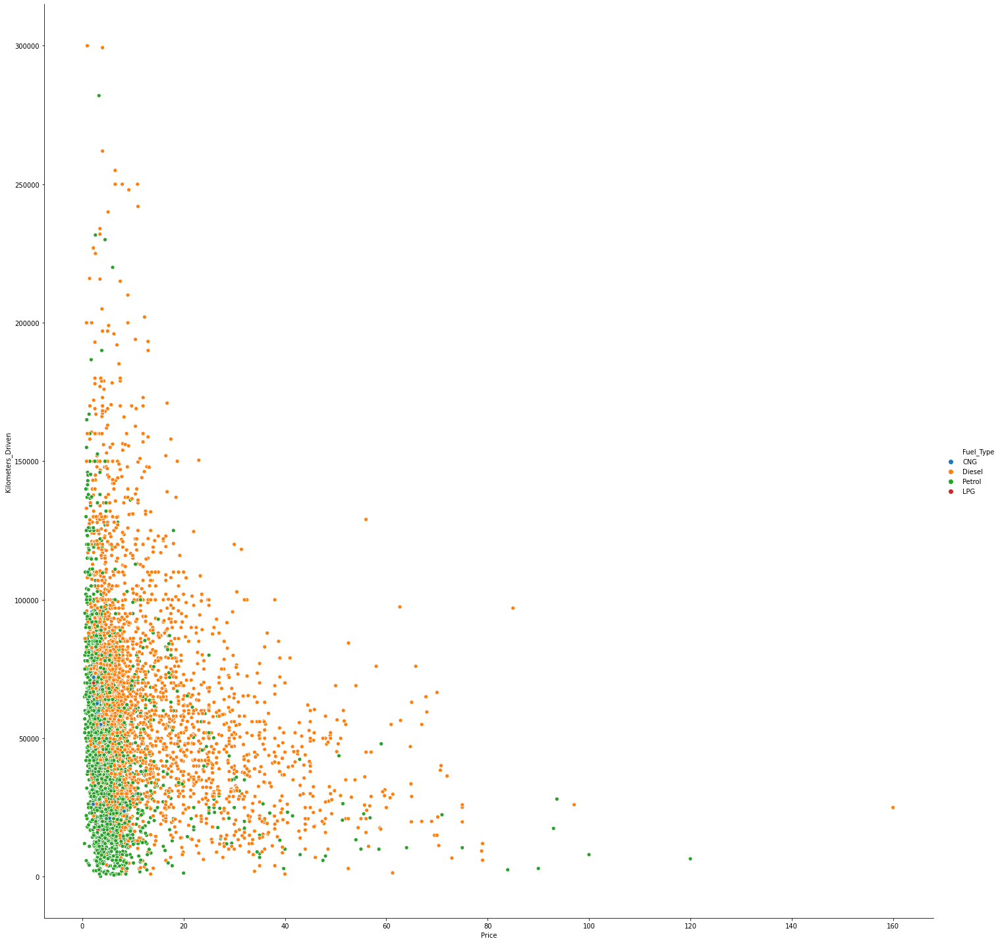

In [ ]:
sb.relplot(x='Price',y='Kilometers_Driven',hue='Fuel_Type',height=20,data=no_outlier_dataset)

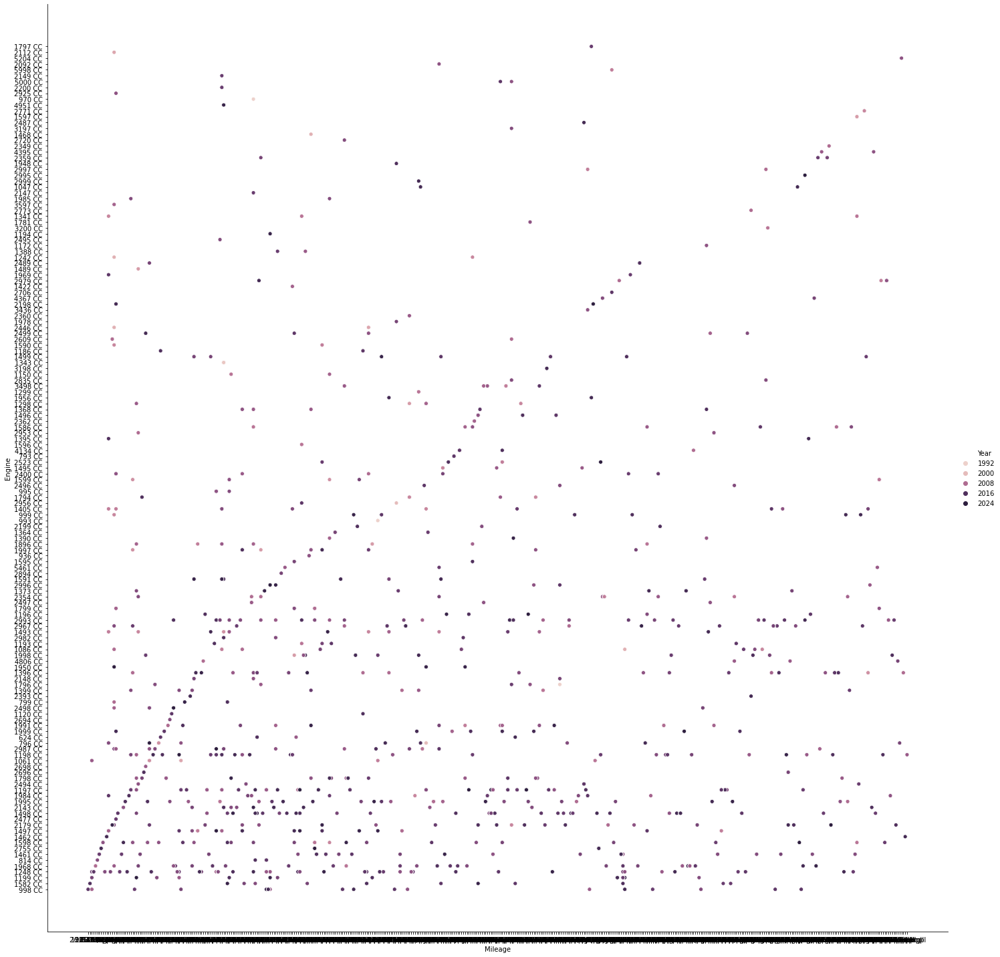

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Mileage',y='Engine',hue='Year',height=20,data=no_outlier_dataset)

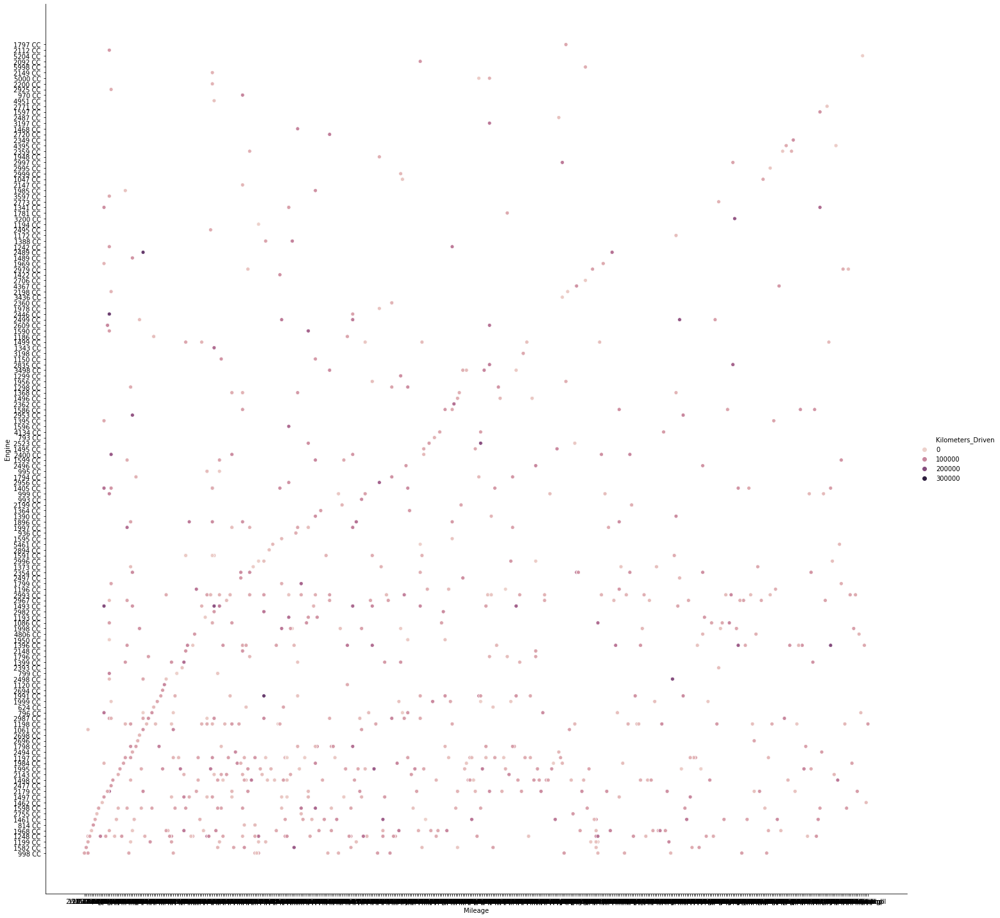

In [ ]:
sb.relplot(x='Mileage',y='Engine',hue='Kilometers_Driven',height=20,data=no_outlier_dataset)

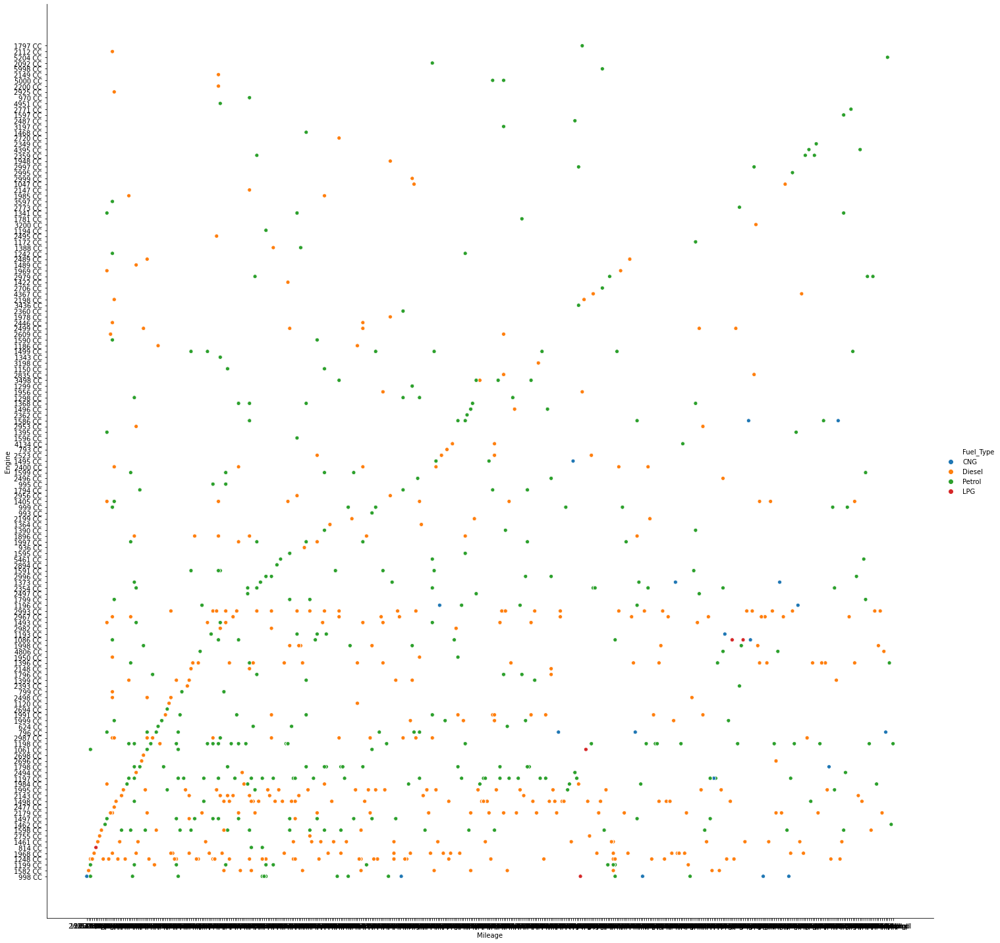

In [ ]:
sb.relplot(x='Mileage',y='Engine',hue='Fuel_Type',height=20,data=no_outlier_dataset)

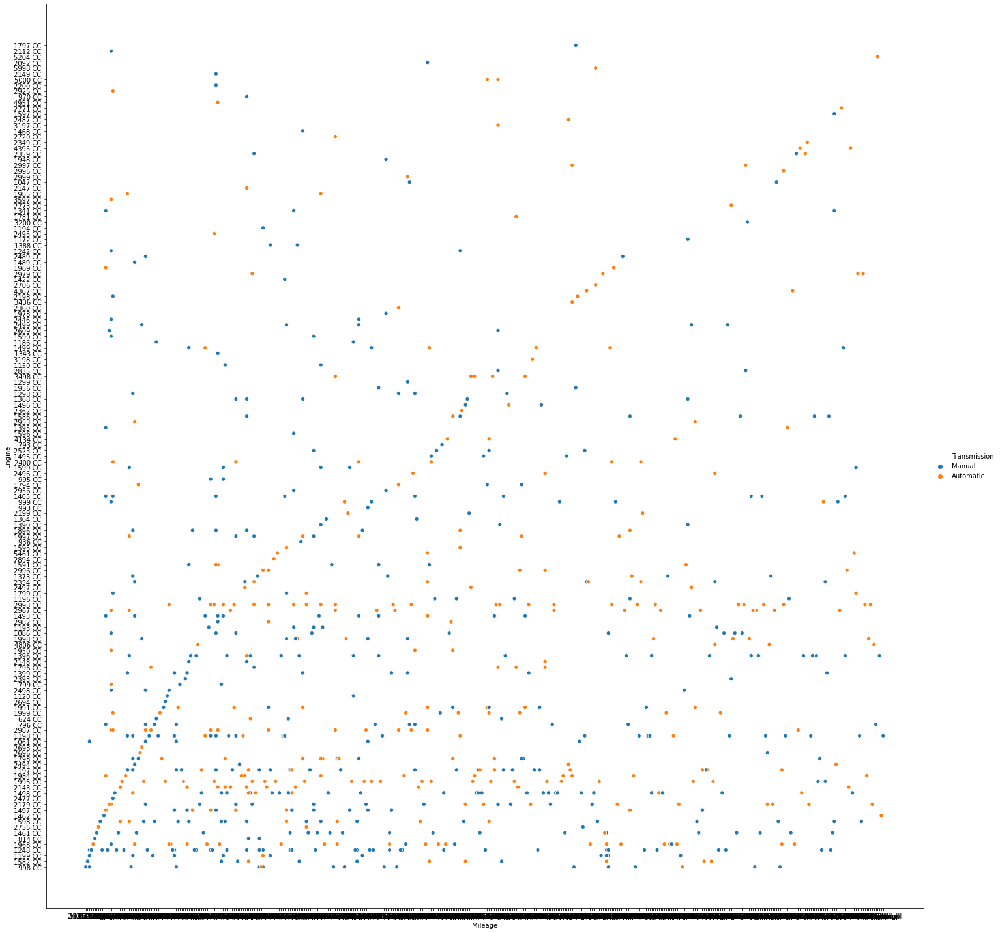

In [ ]:
sb.relplot(x='Mileage',y='Engine',hue='Transmission',height=20,data=no_outlier_dataset)

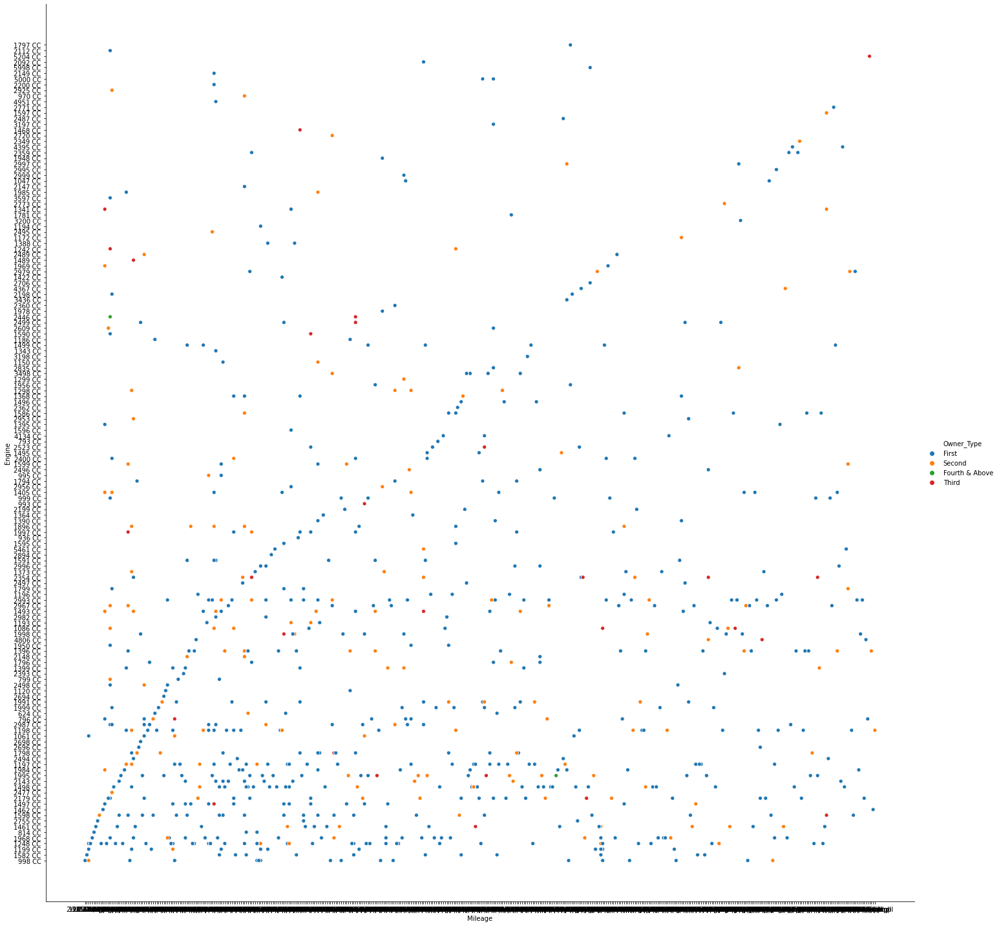

In [ ]:
sb.relplot(x='Mileage',y='Engine',hue='Owner_Type',height=20,data=no_outlier_dataset)

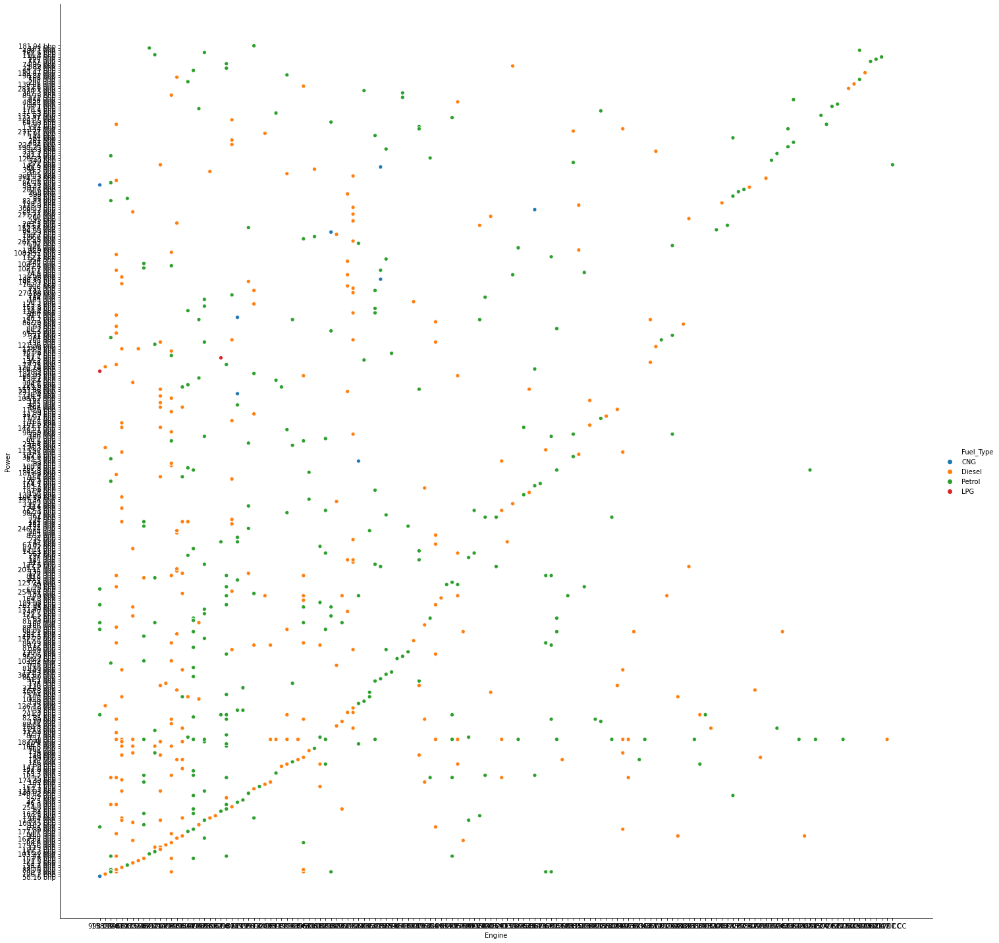

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Engine',y='Power',hue='Fuel_Type',height=20,data=no_outlier_dataset)

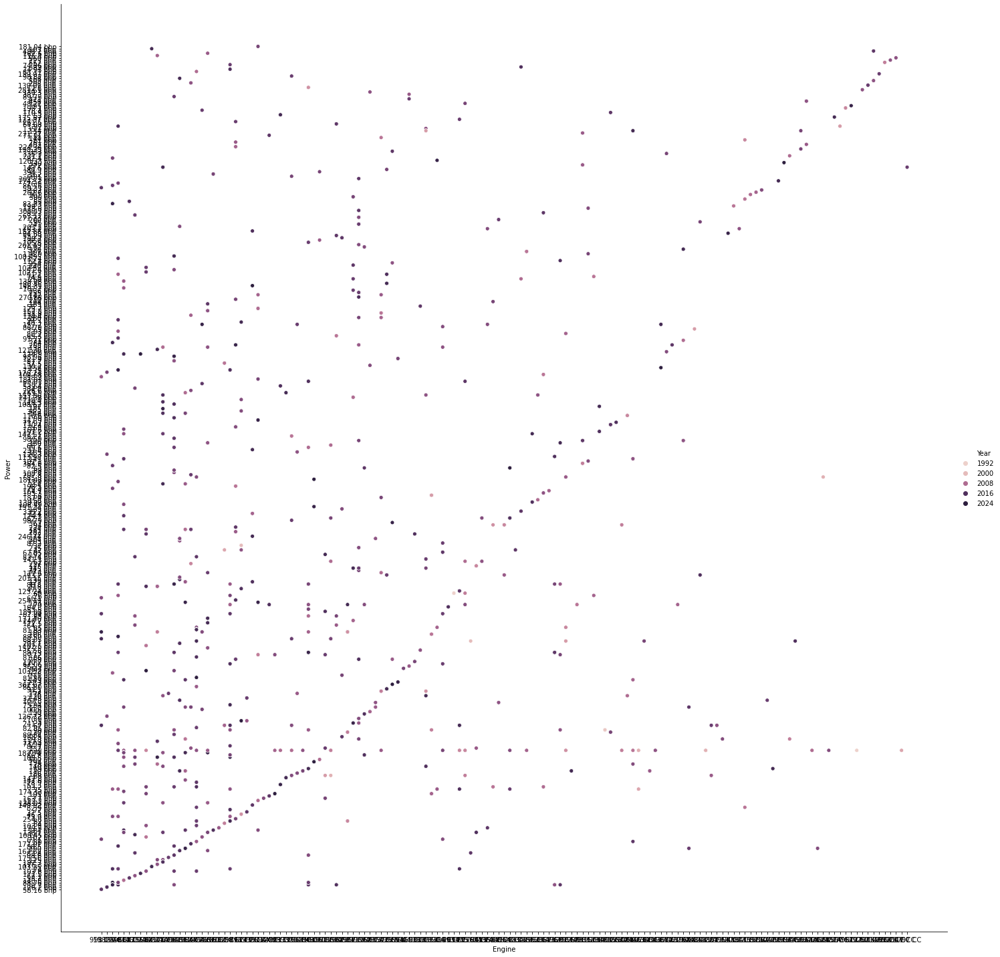

In [ ]:
sb.relplot(x='Engine',y='Power',hue='Year',height=20,data=no_outlier_dataset)

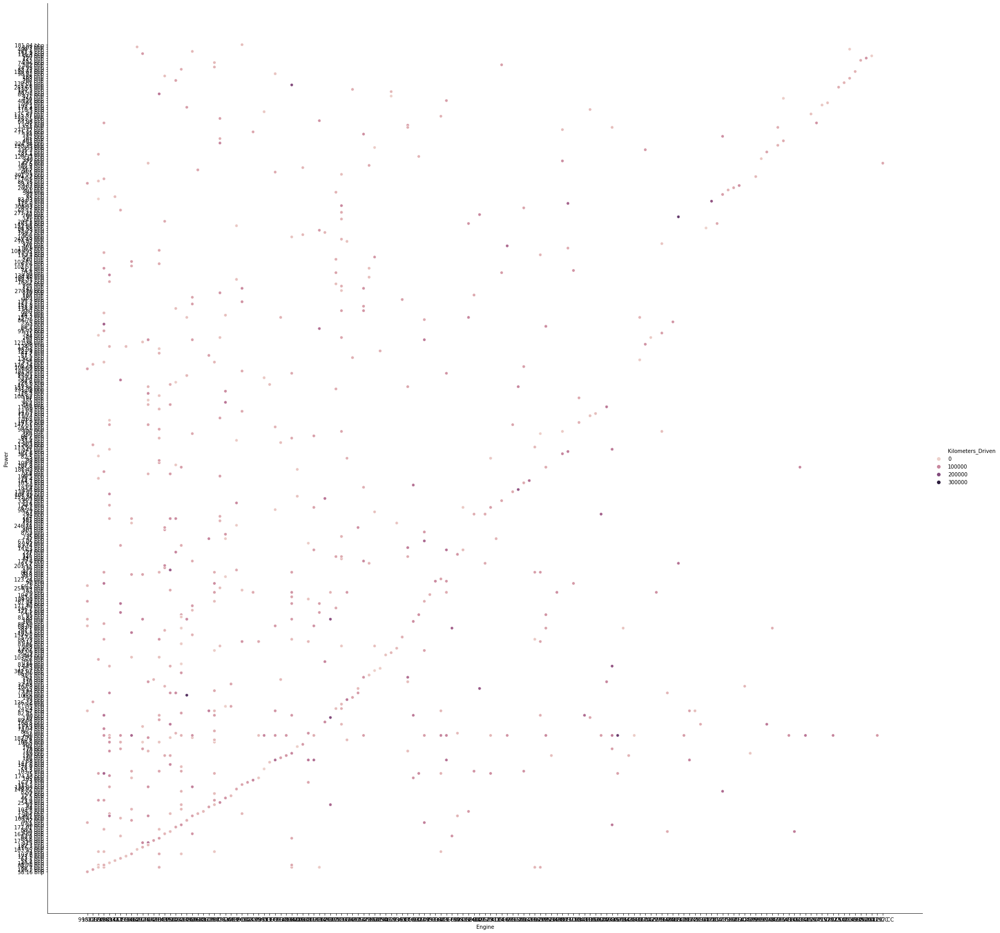

In [ ]:
sb.relplot(x='Engine',y='Power',hue='Kilometers_Driven',height=25,data=no_outlier_dataset)

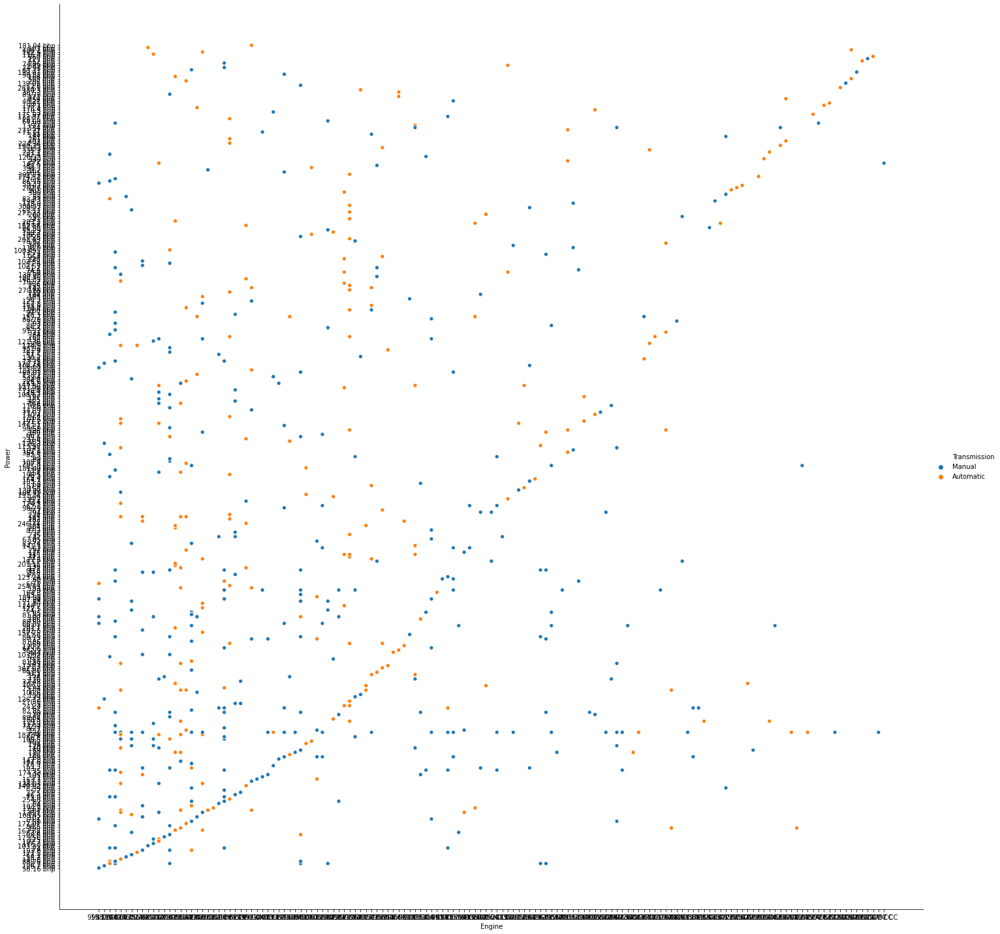

In [ ]:
sb.relplot(x='Engine',y='Power',hue='Transmission',height=20,data=no_outlier_dataset)

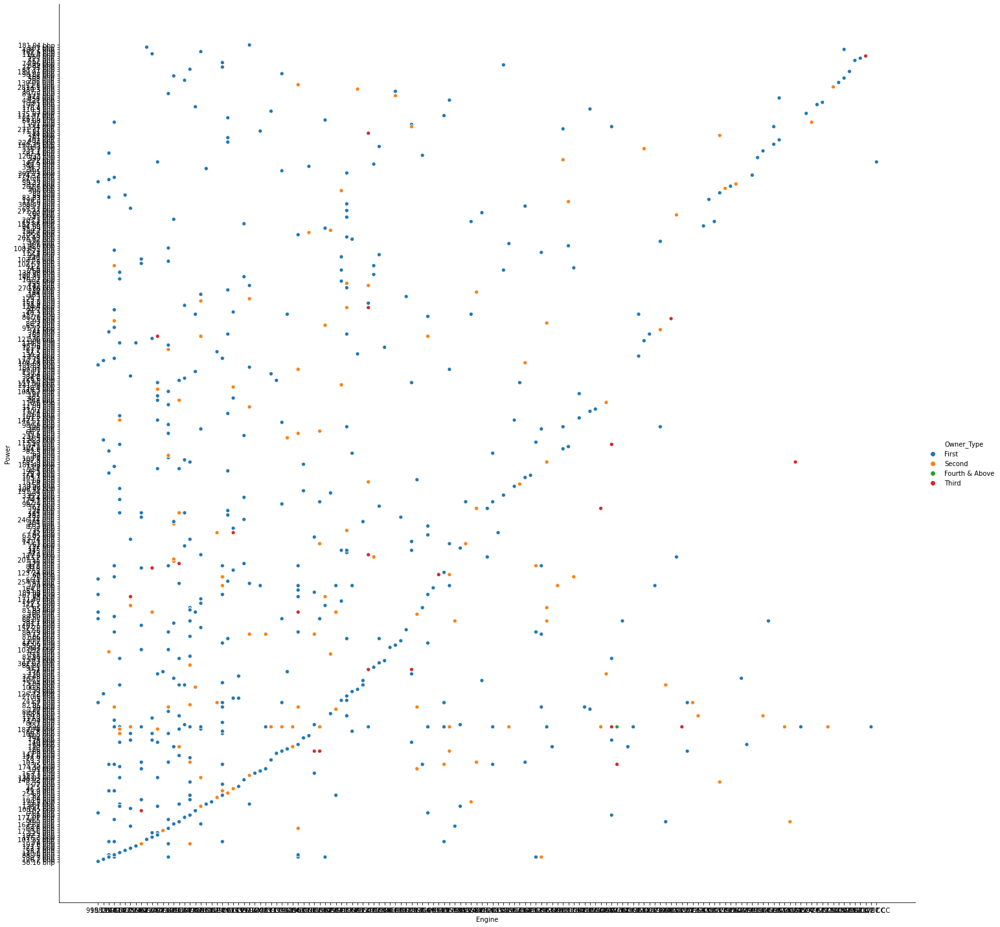

In [ ]:
sb.relplot(x='Engine',y='Power',hue='Owner_Type',height=20,data=no_outlier_dataset)

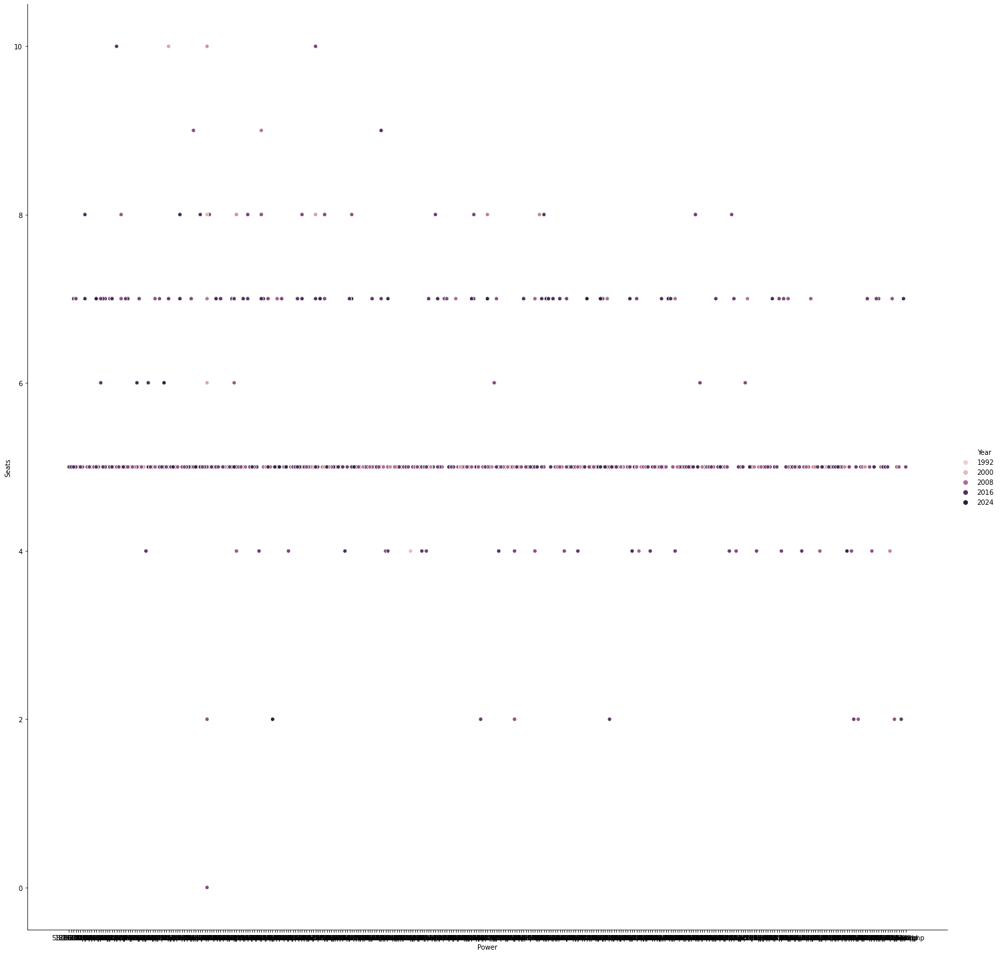

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Power',y='Seats',hue='Year',height=20,data=no_outlier_dataset)

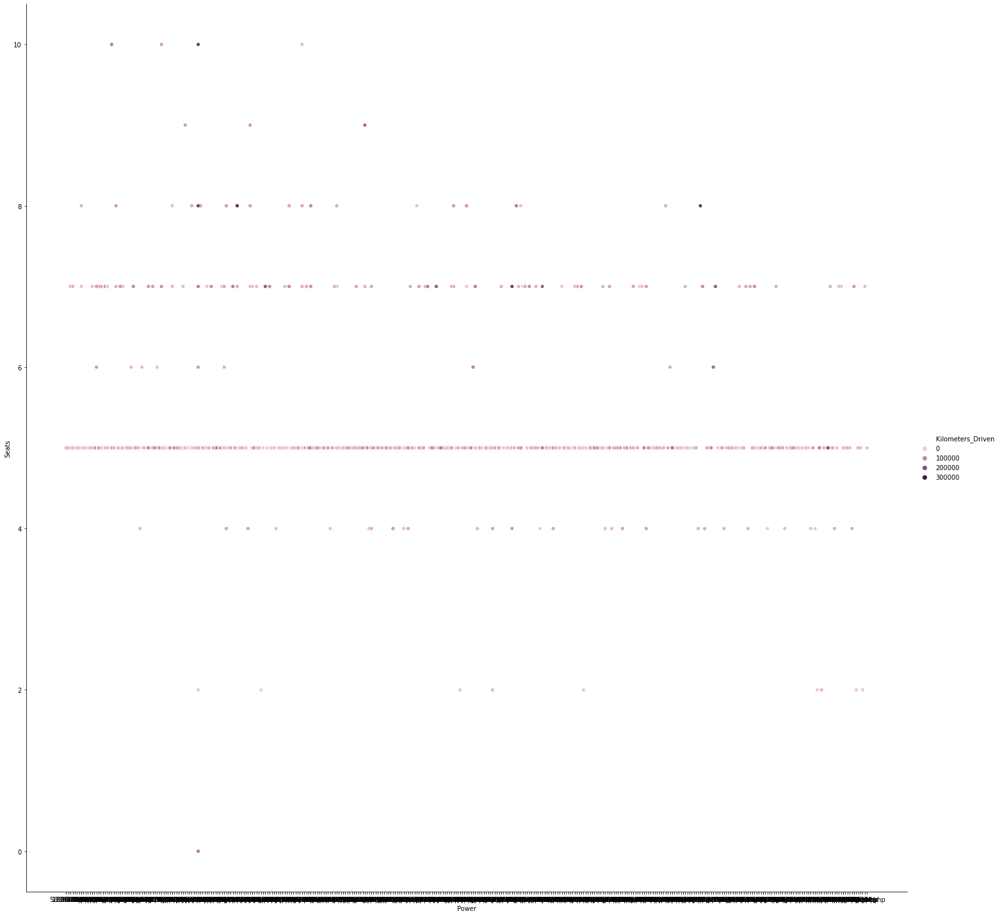

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Power',y='Seats',hue='Kilometers_Driven',height=20,data=no_outlier_dataset)

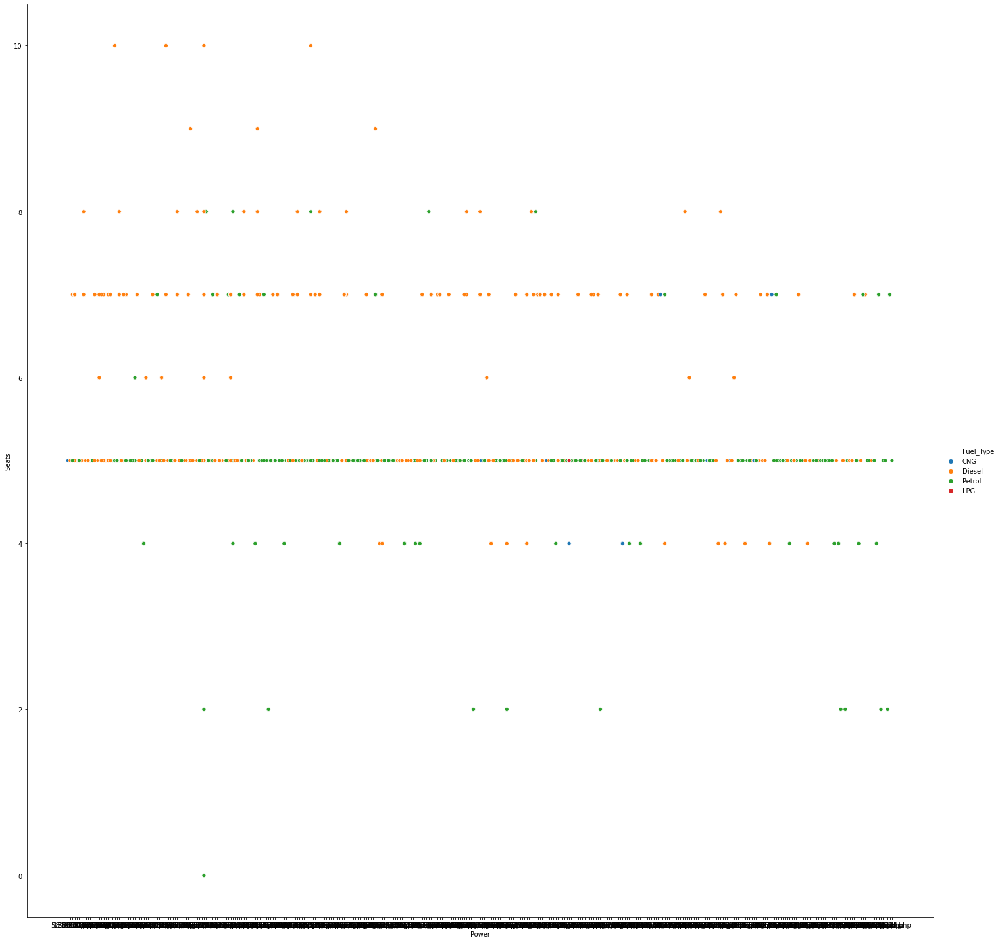

In [ ]:
sb.relplot(x='Power',y='Seats',hue='Fuel_Type',height=20,data=no_outlier_dataset)

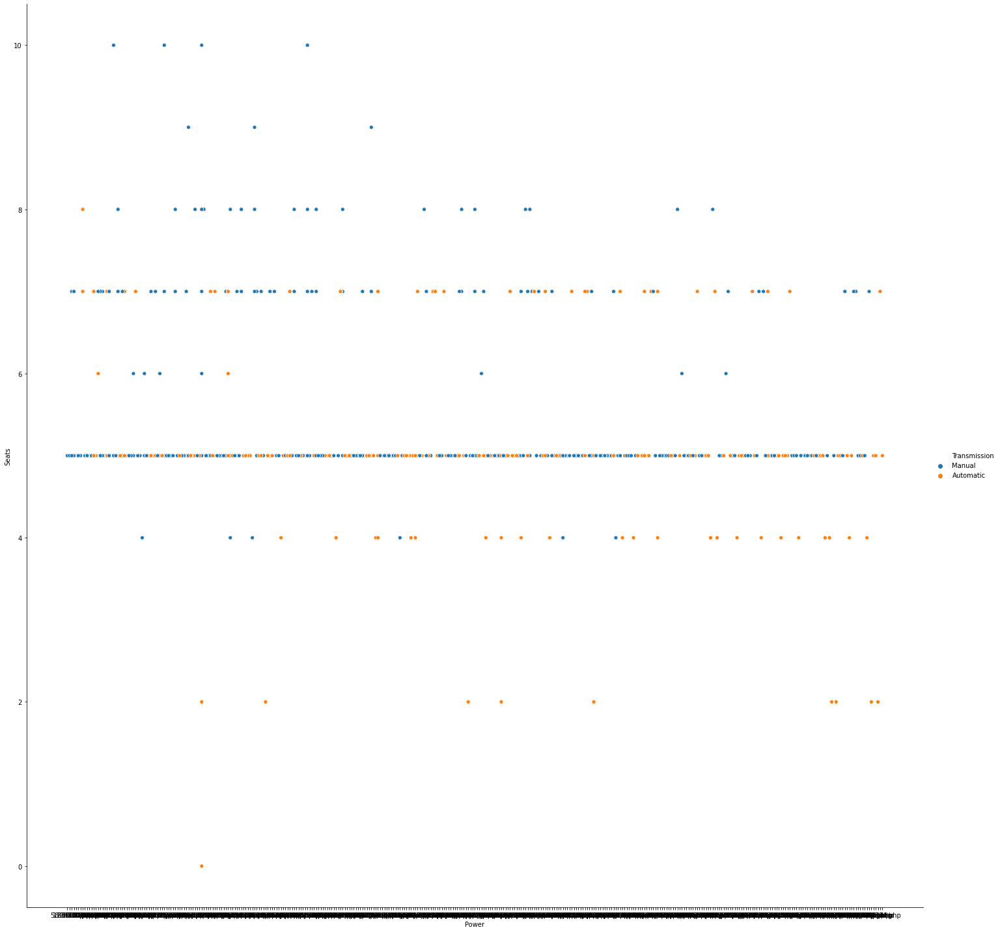

In [ ]:
sb.relplot(x='Power',y='Seats',hue='Transmission',height=20,data=no_outlier_dataset)

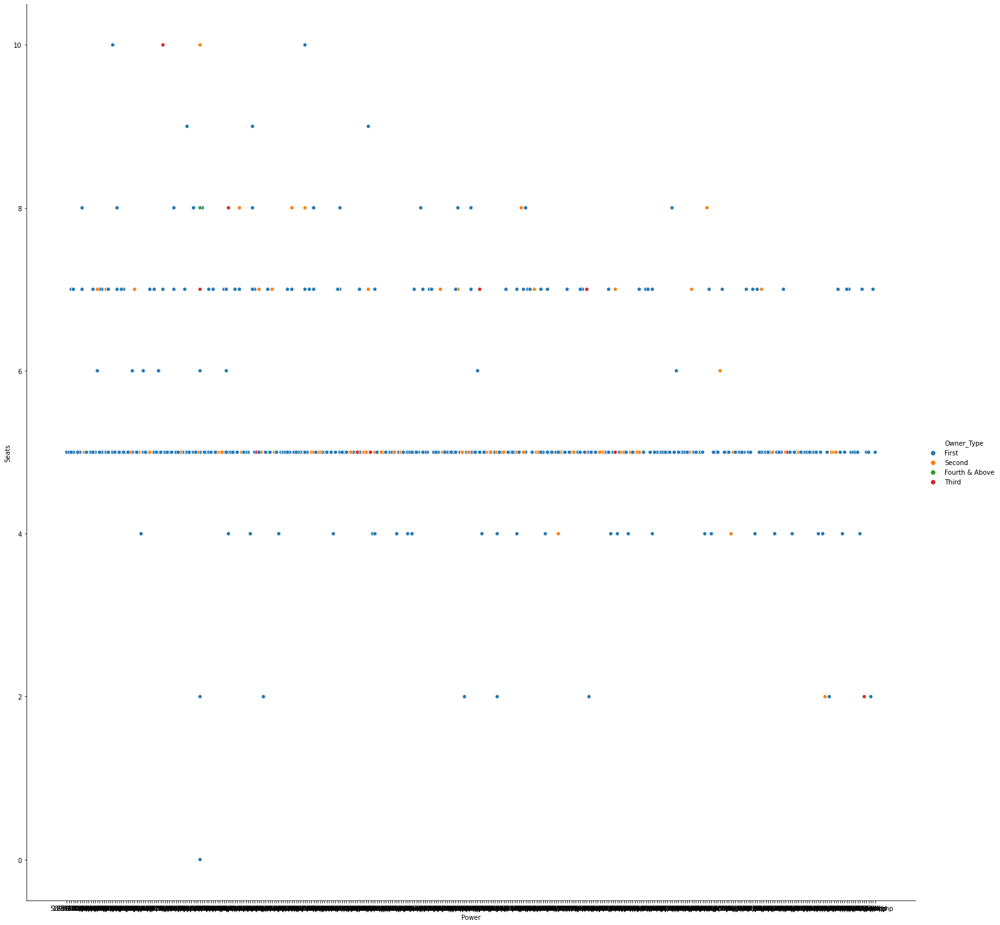

In [ ]:
sb.relplot(x='Power',y='Seats',hue='Owner_Type',height=20,data=no_outlier_dataset)

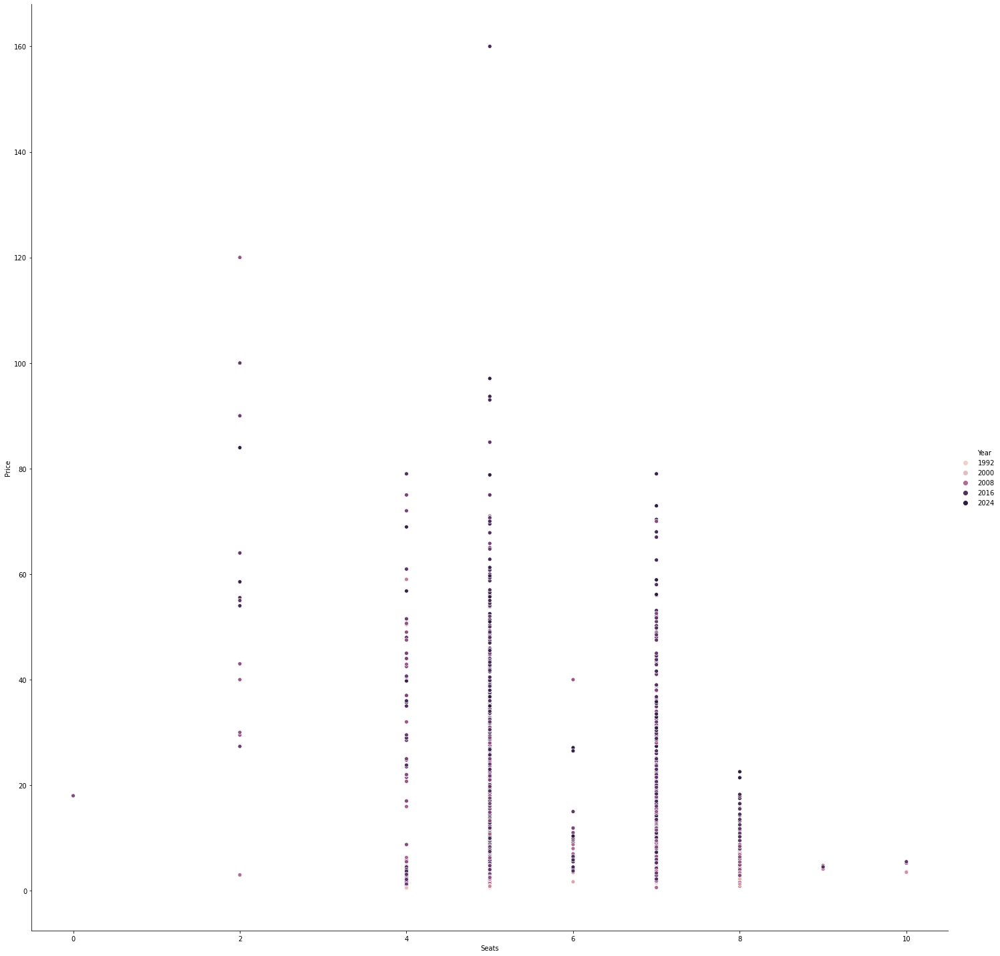

In [ ]:
#no_outlier_dataset.columns
sb.relplot(x='Seats',y='Price',hue='Year',height=20,data=no_outlier_dataset)

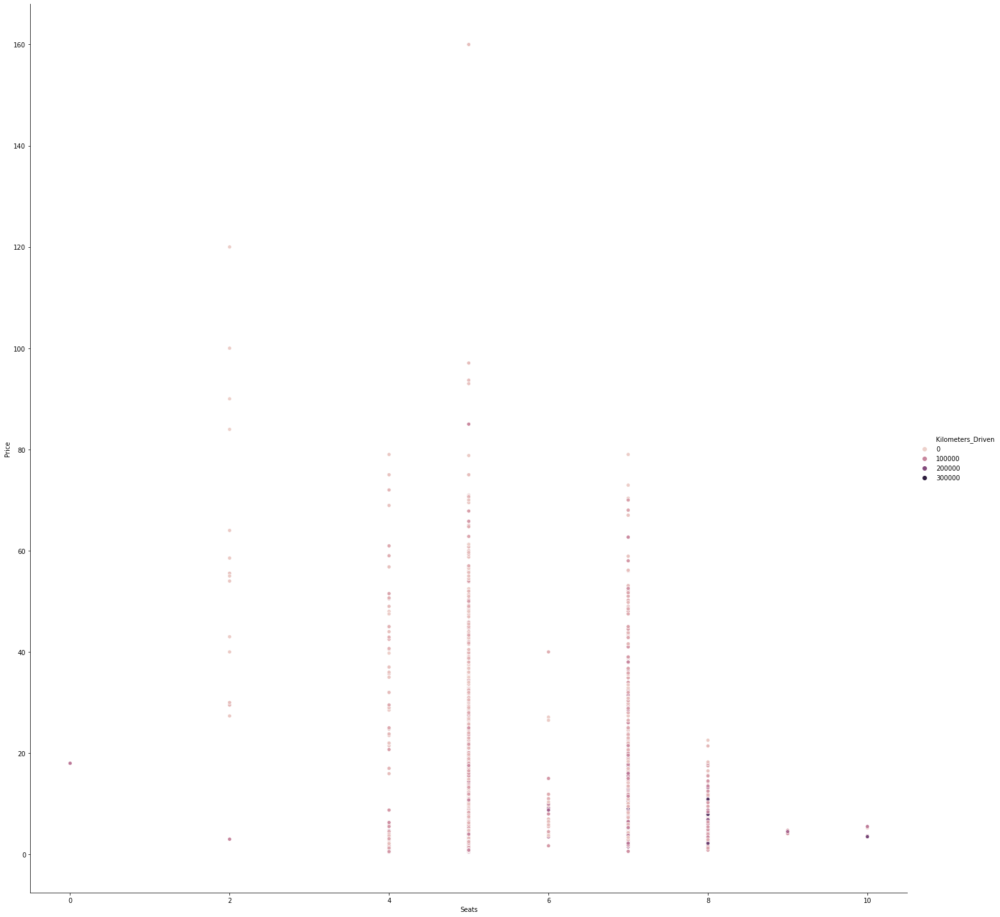

In [ ]:
sb.relplot(x='Seats',y='Price',hue='Kilometers_Driven',height=20,data=no_outlier_dataset)

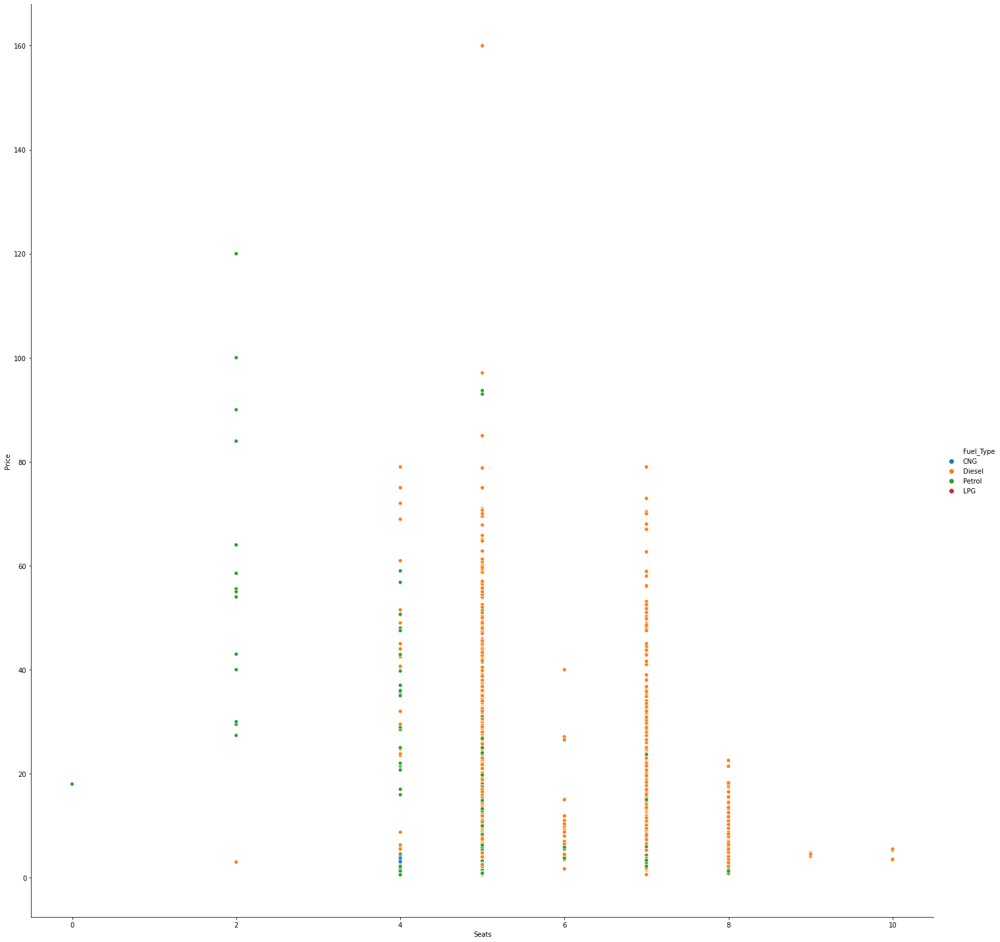

In [ ]:
sb.relplot(x='Seats',y='Price',hue='Fuel_Type',height=20,data=no_outlier_dataset)

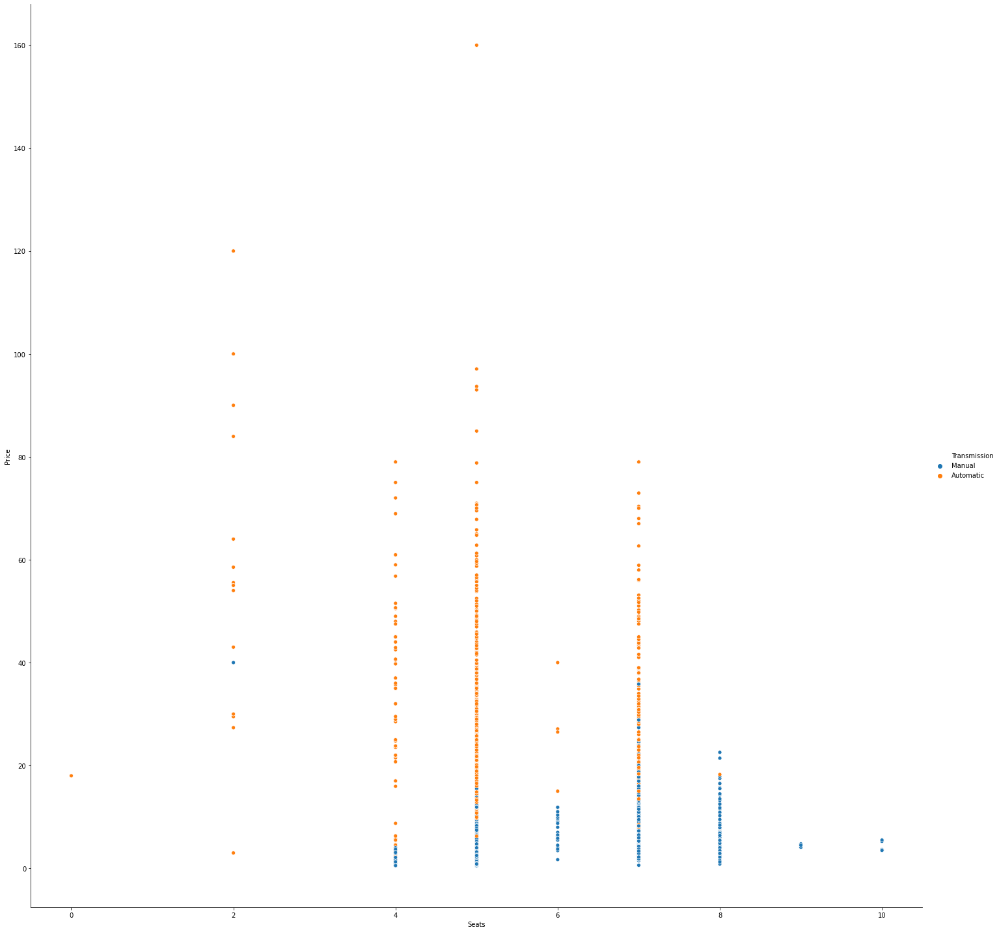

In [ ]:
sb.relplot(x='Seats',y='Price',hue='Transmission',height=20,data=no_outlier_dataset)

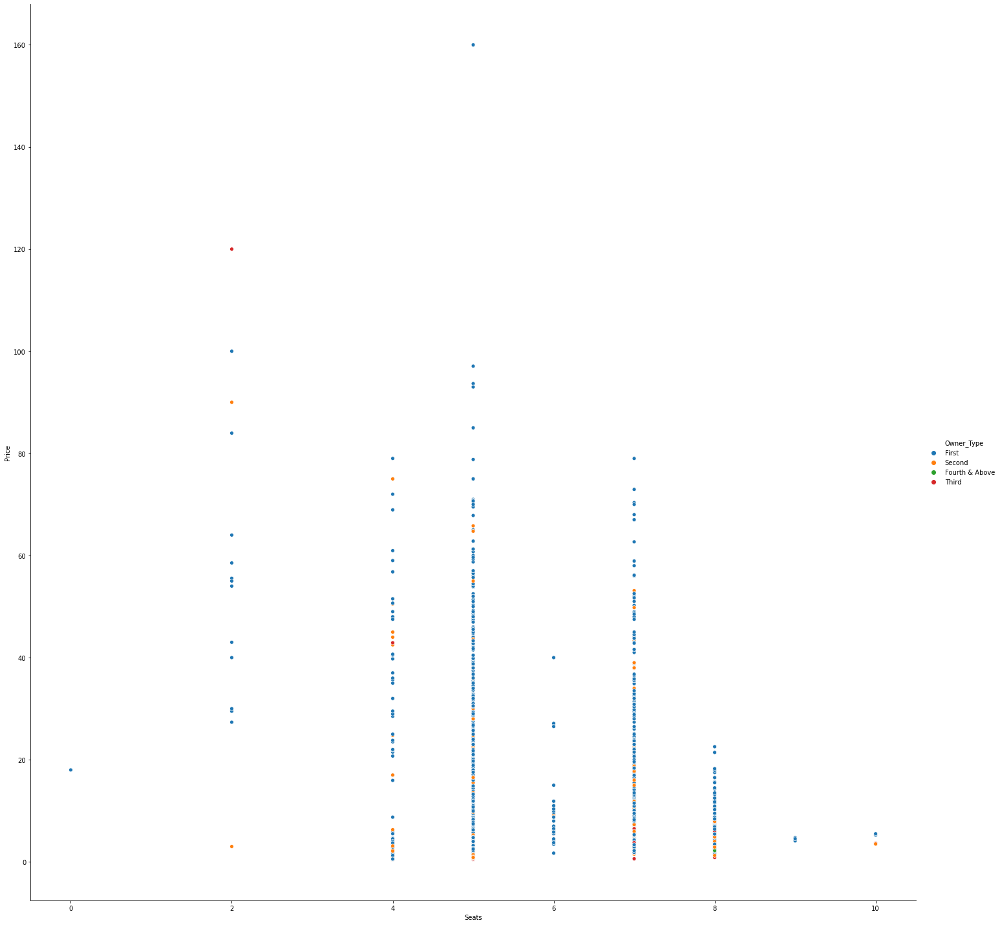

In [ ]:
sb.relplot(x='Seats',y='Price',hue='Owner_Type',height=20,data=no_outlier_dataset)

# Handle Categorical Variable(Using Label Encoding/One hot encoding)

In [ ]:
dataset_new=no_outlier_dataset.copy()

In [ ]:
 from sklearn.preprocessing import LabelEncoder

In [ ]:
label_encoder=LabelEncoder()

In [ ]:
dataset_new["Transmission"]=label_encoder.fit_transform(dataset_new["Transmission"])

In [ ]:
dataset_new

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,z score
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,1,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,1,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038
2,Honda Jazz V,Chennai,2011,46000,Petrol,1,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,1,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,0,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,1,First,28.4 kmpl,1248 CC,74 bhp,5.0,4.75,-0.341960
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,1,First,24.4 kmpl,1120 CC,71 bhp,5.0,4.00,0.451358
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,1,Second,14.0 kmpl,2498 CC,112 bhp,8.0,2.90,-0.040131
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,1,First,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65,-0.138429


In [ ]:
df_dummies=pd.get_dummies(dataset_new, columns=["Fuel_Type","Location","Owner_Type"])
df_dummies

,Name,Year,Kilometers_Driven,Transmission,Mileage,Engine,Power,Seats,Price,z score,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Location_Ahmedabad,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Owner_Type_First,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,Maruti Wagon R LXI CNG,2010,72000,1,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
1,Hyundai Creta 1.6 CRDi SX Option,2015,41000,1,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
2,Honda Jazz V,2011,46000,1,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,Maruti Ertiga VDI,2012,87000,1,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,Audi A4 New 2.0 TDI Multitronic,2013,40670,0,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,2014,27365,1,28.4 kmpl,1248 CC,74 bhp,5.0,4.75,-0.341960,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
6015,Hyundai Xcent 1.1 CRDi S,2015,100000,1,24.4 kmpl,1120 CC,71 bhp,5.0,4.00,0.451358,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
6016,Mahindra Xylo D4 BSIV,2012,55000,1,14.0 kmpl,2498 CC,112 bhp,8.0,2.90,-0.040131,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
6017,Maruti Wagon R VXI,2013,46000,1,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65,-0.138429,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0


# Here Label Encoding is used for Transmission column since it has  two options only manual or automatic, and for other categorical columns instead of using onehot encoding a pandas Dataframe known as dummies is used

# Scaling for Kilometers driven

In [ ]:
from sklearn import preprocessing
import pandas as pd

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
min_max_scaler = preprocessing.MinMaxScaler()
df_dummies[["Kilometers_Driven"]] = min_max_scaler.fit_transform(df_dummies[["Kilometers_Driven"]])

In [ ]:
df_dummies[["Kilometers_Driven"]]

,Kilometers_Driven
0,0.239567
1,0.136174
2,0.152850
3,0.289595
4,0.135074
...,...
6014,0.090698
6015,0.332953
6016,0.182868
6017,0.152850


In [ ]:
df_dummies

,Name,Year,Kilometers_Driven,Transmission,Mileage,Engine,Power,Seats,Price,z score,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Location_Ahmedabad,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Owner_Type_First,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,Maruti Wagon R LXI CNG,2010,0.239567,1,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75,0.145543,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
1,Hyundai Creta 1.6 CRDi SX Option,2015,0.136174,1,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50,-0.193038,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
2,Honda Jazz V,2011,0.152850,1,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50,-0.138429,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,Maruti Ertiga VDI,2012,0.289595,1,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00,0.309372,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,Audi A4 New 2.0 TDI Multitronic,2013,0.135074,0,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74,-0.196643,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,2014,0.090698,1,28.4 kmpl,1248 CC,74 bhp,5.0,4.75,-0.341960,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
6015,Hyundai Xcent 1.1 CRDi S,2015,0.332953,1,24.4 kmpl,1120 CC,71 bhp,5.0,4.00,0.451358,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
6016,Mahindra Xylo D4 BSIV,2012,0.182868,1,14.0 kmpl,2498 CC,112 bhp,8.0,2.90,-0.040131,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
6017,Maruti Wagon R VXI,2013,0.152850,1,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65,-0.138429,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0


# Train_Test_Split

In [ ]:
df_dummies['Mileage'] = df_dummies['Mileage'].str.replace('km/kg', '')
df_dummies['Mileage'] = df_dummies['Mileage'].str.replace('kmpl', '')
df_dummies['Mileage']

0        26.6 
1       19.67 
2        18.2 
3       20.77 
4        15.2 
         ...  
6014     28.4 
6015     24.4 
6016     14.0 
6017     18.9 
6018    25.44 
Name: Mileage, Length: 5968, dtype: object

In [ ]:
df_dummies['Engine'] = df_dummies['Engine'].str.replace('CC', '')
df_dummies['Engine']

0        998 
1       1582 
2       1199 
3       1248 
4       1968 
        ...  
6014    1248 
6015    1120 
6016    2498 
6017     998 
6018     936 
Name: Engine, Length: 5968, dtype: object

In [ ]:
df_dummies['Power'] = df_dummies['Power'].str.replace('bhp', '')
df_dummies['Power']

0       58.16 
1       126.2 
2        88.7 
3       88.76 
4       140.8 
         ...  
6014       74 
6015       71 
6016      112 
6017     67.1 
6018     57.6 
Name: Power, Length: 5968, dtype: object

In [ ]:
df_dummies

,Name,Year,Kilometers_Driven,Transmission,Mileage,Engine,Power,Seats,Price,z score,...,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Owner_Type_First,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,Maruti Wagon R LXI CNG,2010,0.239567,1,26.6,998,58.16,5.0,1.75,0.145543,...,0,0,0,0,1,0,1,0,0,0
1,Hyundai Creta 1.6 CRDi SX Option,2015,0.136174,1,19.67,1582,126.2,5.0,12.50,-0.193038,...,0,0,0,0,0,1,1,0,0,0
2,Honda Jazz V,2011,0.152850,1,18.2,1199,88.7,5.0,4.50,-0.138429,...,0,0,0,0,0,0,1,0,0,0
3,Maruti Ertiga VDI,2012,0.289595,1,20.77,1248,88.76,7.0,6.00,0.309372,...,0,0,0,0,0,0,1,0,0,0
4,Audi A4 New 2.0 TDI Multitronic,2013,0.135074,0,15.2,1968,140.8,5.0,17.74,-0.196643,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,2014,0.090698,1,28.4,1248,74,5.0,4.75,-0.341960,...,0,0,0,0,0,0,1,0,0,0
6015,Hyundai Xcent 1.1 CRDi S,2015,0.332953,1,24.4,1120,71,5.0,4.00,0.451358,...,0,1,0,0,0,0,1,0,0,0
6016,Mahindra Xylo D4 BSIV,2012,0.182868,1,14.0,2498,112,8.0,2.90,-0.040131,...,0,1,0,0,0,0,0,0,1,0
6017,Maruti Wagon R VXI,2013,0.152850,1,18.9,998,67.1,5.0,2.65,-0.138429,...,0,0,0,1,0,0,1,0,0,0


In [ ]:
df_dummies.columns

Index(['Name', 'Year', 'Kilometers_Driven', 'Transmission', 'Mileage',
       'Engine', 'Power', 'Seats', 'Price', 'z score', 'Fuel_Type_CNG',
       'Fuel_Type_Diesel', 'Fuel_Type_LPG', 'Fuel_Type_Petrol',
       'Location_Ahmedabad', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Owner_Type_First',
       'Owner_Type_Fourth & Above', 'Owner_Type_Second', 'Owner_Type_Third'],
      dtype='object')

In [ ]:
x=df_dummies[['Kilometers_Driven', 'Transmission', 'Mileage',
       'Engine', 'Seats', 'Price', 'z score', 'Fuel_Type_CNG',
       'Fuel_Type_Diesel', 'Fuel_Type_LPG', 'Fuel_Type_Petrol',
       'Location_Ahmedabad', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Owner_Type_First',
       'Owner_Type_Fourth & Above', 'Owner_Type_Second', 'Owner_Type_Third']]
y=df_dummies['Price']

In [ ]:
x

,Kilometers_Driven,Transmission,Mileage,Engine,Seats,Price,z score,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_LPG,Fuel_Type_Petrol,Location_Ahmedabad,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Owner_Type_First,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,0.239567,1,26.6,998,5.0,1.75,0.145543,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
1,0.136174,1,19.67,1582,5.0,12.50,-0.193038,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
2,0.152850,1,18.2,1199,5.0,4.50,-0.138429,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,0.289595,1,20.77,1248,7.0,6.00,0.309372,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
4,0.135074,0,15.2,1968,5.0,17.74,-0.196643,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,0.090698,1,28.4,1248,5.0,4.75,-0.341960,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
6015,0.332953,1,24.4,1120,5.0,4.00,0.451358,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
6016,0.182868,1,14.0,2498,8.0,2.90,-0.040131,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
6017,0.152850,1,18.9,998,5.0,2.65,-0.138429,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0


In [ ]:
y

0        1.75
1       12.50
2        4.50
3        6.00
4       17.74
        ...  
6014     4.75
6015     4.00
6016     2.90
6017     2.65
6018     2.50
Name: Price, Length: 5968, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train , x_test , y_train , y_test = train_test_split(x,y,test_size=0.2)

In [ ]:
len(x_train)

4774

In [ ]:
len(x_test)

1194

In [ ]:
from sklearn.linear_model import LinearRegression
clf=LinearRegression()

In [ ]:
clf.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
predictions=clf.predict(x_test)
predictions

array([ 7.97,  5.9 ,  5.3 , ..., 40.  ,  6.2 , 35.  ])

In [ ]:
clf.score(x_test,y_test)

1.0

ML Regression Algorithms (CONFUSION MATRIX)


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
cutoff = 0.7                              # decide on a cutoff limit
y_pred_classes = np.zeros_like(predictions)    # initialise a matrix full with zeros
y_pred_classes[predictions > cutoff] = 1       # add a 1 if the cutoff was breached

In [ ]:
y_test_classes = np.zeros_like(predictions)
y_test_classes[predictions > cutoff] = 1

In [ ]:
confusion_matrix(y_test_classes, y_pred_classes)

array([[   6,    0],
       [   0, 1188]])

In [ ]:
coef=clf.coef_

In [ ]:
clf.intercept_

-7.638334409421077e-14

In [ ]:
mean=np.mean(coef)
mean

0.03846153846153839

In [ ]:
mean*predictions+clf.intercept_

array([0.30653846, 0.22692308, 0.20384615, ..., 1.53846154, 0.23846154,
       1.34615385])

ERROR METRICS

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
mse = mean_squared_error(y_test,predictions)

In [ ]:
mse

7.12088023748617e-28

In [ ]:
rmse = mse ** 0.5
rmse

2.668497749200132e-14

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
mean_absolute_error(y_test, predictions)

1.9856255110268314e-14

In [ ]:
clf.score(x,y)

1.0

Task Done


```
# This is formatted as code
```

